# CycleGAN, Image-to-Image Translation

In this notebook, we're going to define and train a CycleGAN to read in an image from a set $X$ and transform it so that it looks as if it belongs in set $Y$. Specifically, we'll look at a set of images of [Yosemite national park](https://en.wikipedia.org/wiki/Yosemite_National_Park) taken either during the summer of winter. The seasons are our two domains!

>The objective will be to train generators that learn to transform an image from domain $X$ into an image that looks like it came from domain $Y$ (and vice versa). 

Some examples of image data in both sets are pictured below.

<img src='notebook_images/XY_season_images.png' width=50% />

### Unpaired Training Data

These images do not come with labels, but CycleGANs give us a way to learn the mapping between one image domain and another using an **unsupervised** approach. A CycleGAN is designed for image-to-image translation and it learns from unpaired training data. This means that in order to train a generator to translate images from domain $X$ to domain $Y$, we do not have to have exact correspondences between individual images in those domains. For example, in [the paper that introduced CycleGANs](https://arxiv.org/abs/1703.10593), the authors are able to translate between images of horses and zebras, even though there are no images of a zebra in exactly the same position as a horse or with exactly the same background, etc. Thus, CycleGANs enable learning a mapping from one domain $X$ to another domain $Y$ without having to find perfectly-matched, training pairs!

<img src='notebook_images/horse2zebra.jpg' width=50% />

### CycleGAN and Notebook Structure

A CycleGAN is made of two types of networks: **discriminators, and generators**. In this example, the discriminators are responsible for classifying images as real or fake (for both $X$ and $Y$ kinds of images). The generators are responsible for generating convincing, fake images for both kinds of images. 

This notebook will detail the steps you should take to define and train such a CycleGAN. 

>1. You'll load in the image data using PyTorch's DataLoader class to efficiently read in images from a specified directory. 
2. Then, you'll be tasked with defining the CycleGAN architecture according to provided specifications. You'll define the discriminator and the generator models.
3. You'll complete the training cycle by calculating the adversarial and cycle consistency losses for the generator and discriminator network and completing a number of training epochs. *It's suggested that you enable GPU usage for training.*
4. Finally, you'll evaluate your model by looking at the loss over time and looking at sample, generated images.


---

## Load and Visualize the Data

We'll first load in and visualize the training data, importing the necessary libraries to do so.

> If you are working locally, you'll need to download the data as a zip file by [clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be66e78_summer2winter-yosemite/summer2winter-yosemite.zip).

It may be named `summer2winter-yosemite/` with a dash or an underscore, so take note, extract the data to your home directory and make sure the below `image_dir` matches. Then you can proceed with the following loading code.

In [1]:
# loading in and transforming data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

### DataLoaders

The `get_data_loader` function returns training and test DataLoaders that can load data efficiently and in specified batches. The function has the following parameters:
* `image_type`: `summer` or `winter`,  the names of the directories where the X and Y images are stored
* `image_dir`: name of the main image directory, which holds all training and test images
* `image_size`: resized, square image dimension (all images will be resized to this dim)
* `batch_size`: number of images in one batch of data

The test data is strictly for feeding to our generators, later on, so we can visualize some generated samples on fixed, test data.

You can see that this function is also responsible for making sure our images are of the right, square size (128x128x3) and converted into Tensor image types.

**It's suggested that you use the default values of these parameters.**

Note: If you are trying this code on a different set of data, you may get better results with larger `image_size` and `batch_size` parameters. If you change the `batch_size`, make sure that you create complete batches in the training loop otherwise you may get an error when trying to save sample data. 

In [2]:
def get_data_loader(image_type, image_dir='summer2winter_yosemite', 
                    image_size=128, batch_size=16, num_workers=0):
    """Returns training and test data loaders for a given image type, either 'summer' or 'winter'. 
       These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    """
    
    # resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size), # resize to 128x128
                                    transforms.ToTensor()])

    # get training and test directories
    image_path = './' + image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [3]:
# Create train and test dataloaders for images from the two domains X and Y
# image_type = directory names for our data
dataloader_X, test_dataloader_X = get_data_loader(image_type='summer')
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='winter')

## Display some Training Images

Below we provide a function `imshow` that reshape some given images and converts them to NumPy images so that they can be displayed by `plt`. This cell should display a grid that contains a batch of image data from set $X$.

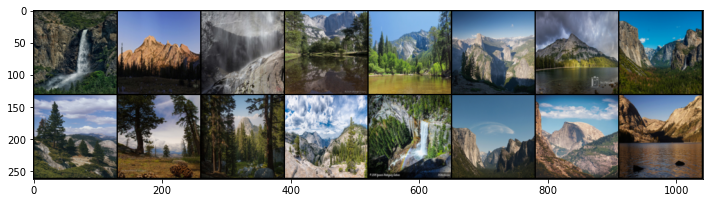

In [4]:
# helper imshow function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    

# get some images from X
dataiter = iter(dataloader_X)
# the "_" is a placeholder for no labels
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

Next, let's visualize a batch of images from set $Y$.

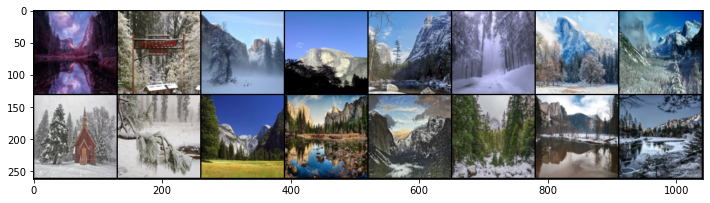

In [5]:
# get some images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

### Pre-processing: scaling from -1 to 1

We need to do a bit of pre-processing; we know that the output of our `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. (Right now, they are in a range from 0-1.)

In [6]:
# current range
img = images[0]

print('Min: ', img.min())
print('Max: ', img.max())

Min:  tensor(0.)
Max:  tensor(0.9686)


In [7]:
# helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    
    # scale from 0-1 to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
# scaled range
scaled_img = scale(img)

print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-1.)
Scaled max:  tensor(0.9373)


---
## Define the Model

A CycleGAN is made of two discriminator and two generator networks.

## Discriminators

The discriminators, $D_X$ and $D_Y$, in this CycleGAN are convolutional neural networks that see an image and attempt to classify it as real or fake. In this case, real is indicated by an output close to 1 and fake as close to 0. The discriminators have the following architecture:

<img src='notebook_images/discriminator_layers.png' width=80% />

This network sees a 128x128x3 image, and passes it through 5 convolutional layers that downsample the image by a factor of 2. The first four convolutional layers have a BatchNorm and ReLu activation function applied to their output, and the last acts as a classification layer that outputs a prediction map with depth of one. Contrary to what the figure above indicates, the final output is not required to have a width and depth of one. In the original paper, the authors passed a 4x4 kernel with stride of 1 in the final convolutional layer. You should replicate that strategy.

### Convolutional Helper Function

To define the discriminators, you're expected to use the provided `conv` function, which creates a convolutional layer + an optional batch norm layer.

In [9]:
import torch.nn as nn
import torch.nn.functional as F

# helper conv function
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, 
                           kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    
    layers.append(conv_layer)

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

### Define the Discriminator Architecture

Your task is to fill in the `__init__` function with the specified 5 layer conv net architecture. Both $D_X$ and $D_Y$ have the same architecture, so we only need to define one class, and later instantiate two discriminators. 
> It's recommended that you use a **kernel size of 4x4** and use that to determine the correct stride and padding size for each layer. [This Stanford resource](http://cs231n.github.io/convolutional-networks/#conv) may also help in determining stride and padding sizes.

* Define your convolutional layers in `__init__`
* Then fill in the forward behavior of the network

The `forward` function defines how an input image moves through the discriminator, and the most important thing is to pass it through your convolutional layers in order, with a **ReLu** activation function applied to all but the last layer.

You should **not** apply a sigmoid activation function to the output, here, and that is because we are planning on using a squared error loss for training. And you can read more about this loss function, later in the notebook.

In [10]:
class Discriminator(nn.Module):
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()

        # Define all convolutional layers
        # Should accept an RGB image as input and output a single value
        self.conv1 =  conv(in_channels=3, out_channels=conv_dim, kernel_size=4, batch_norm=False) # output shape: (64, 64, 64)
        self.conv2 =  conv(in_channels=conv_dim, out_channels=conv_dim * 2, kernel_size=4,batch_norm=True)# output shape: (32, 32, 128)
        self.conv3 =  conv(in_channels=conv_dim * 2, out_channels=conv_dim * 4, kernel_size=4, batch_norm=True)# output shape: (16, 16, 256)
        self.conv4 =  conv(in_channels=conv_dim * 4, out_channels=conv_dim * 8, kernel_size=4, batch_norm=True)# output shape: (8, 8, 512)
        self.conv5 =  nn.Conv2d(in_channels=conv_dim * 8, out_channels=1, stride=8, kernel_size=4)# output shape: (1, 1, 1)

    def forward(self, x):
        # define feedforward behavior
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.conv5(x)
        return x

## Generators

The generators, `G_XtoY` and `G_YtoX` (sometimes called F), are made of an **encoder**, a conv net that is responsible for turning an image into a smaller feature representation, and a **decoder**, a *transpose_conv* net that is responsible for turning that representation into an transformed image. These generators, one from XtoY and one from YtoX, have the following architecture:

<img src='notebook_images/cyclegan_generator_ex.png' width=90% />

This network sees a 128x128x3 image, compresses it into a feature representation as it goes through three convolutional layers and reaches a series of residual blocks. It goes through a few (typically 6 or more) of these residual blocks, then it goes through three transpose convolutional layers (sometimes called *de-conv* layers) which upsample the output of the resnet blocks and create a new image!

Note that most of the convolutional and transpose-convolutional layers have BatchNorm and ReLu functions applied to their outputs with the exception of the final transpose convolutional layer, which has a `tanh` activation function applied to the output. Also, the residual blocks are made of convolutional and batch normalization layers, which we'll go over in more detail, next.

---
### Residual Block Class

To define the generators, you're expected to define a `ResidualBlock` class which will help you connect the encoder and decoder portions of the generators. You might be wondering, what exactly is a Resnet block? It may sound familiar from something like ResNet50 for image classification, pictured below.

<img src='notebook_images/resnet_50.png' width=90%/>

ResNet blocks rely on connecting the output of one layer with the input of an earlier layer. The motivation for this structure is as follows: very deep neural networks can be difficult to train. Deeper networks are more likely to have vanishing or exploding gradients and, therefore, have trouble reaching convergence; batch normalization helps with this a bit. However, during training, we often see that deep networks respond with a kind of training degradation. Essentially, the training accuracy stops improving and gets saturated at some point during training. In the worst cases, deep models would see their training accuracy actually worsen over time!

One solution to this problem is to use **Resnet blocks** that allow us to learn so-called *residual functions* as they are applied to layer inputs. You can read more about this proposed architecture in the paper, [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf) by Kaiming He et. al, and the below image is from that paper.

<img src='notebook_images/resnet_block.png' width=40%/>

### Residual Functions

Usually, when we create a deep learning model, the model (several layers with activations applied) is responsible for learning a mapping, `M`, from an input `x` to an output `y`.
>`M(x) = y` (Equation 1)

Instead of learning a direct mapping from `x` to `y`, we can instead define a **residual function**
> `F(x) = M(x) - x`

This looks at the difference between a mapping applied to x and the original input, x. `F(x)` is, typically, two convolutional layers + normalization layer and a ReLu in between. These convolutional layers should have the same number of inputs as outputs. This mapping can then be written as the following; a function of the residual function and the input x. The addition step creates a kind of loop that connects the input x to the output, y:
>`M(x) = F(x) + x` (Equation 2) or

>`y = F(x) + x` (Equation 3)

#### Optimizing a Residual Function

The idea is that it is easier to optimize this residual function `F(x)` than it is to optimize the original mapping `M(x)`. Consider an example; what if we want `y = x`?

From our first, direct mapping equation, **Equation 1**, we could set `M(x) = x` but it is easier to solve the residual equation `F(x) = 0`, which, when plugged in to **Equation 3**, yields `y = x`.


### Defining the `ResidualBlock` Class

To define the `ResidualBlock` class, we'll define residual functions (a series of layers), apply them to an input x and add them to that same input. This is defined just like any other neural network, with an `__init__` function and the addition step in the `forward` function. 

In our case, you'll want to define the residual block as:
* Two convolutional layers with the same size input and output
* Batch normalization applied to the outputs of the convolutional layers
* A ReLu function on the output of the *first* convolutional layer

Then, in the `forward` function, add the input x to this residual block. Feel free to use the helper `conv` function from above to create this block.

In [11]:
# residual block class
class ResidualBlock(nn.Module):
    """Defines a residual block.
       This adds an input x to a convolutional layer (applied to x) with the same size input and output.
       These blocks allow a model to learn an effective transformation from one domain to another.
    """
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        # conv_dim = number of inputs  
        
        # define two convolutional layers + batch normalization that will act as our residual function, F(x)
        # layers should have the same shape input as output; I suggest a kernel_size of 3
        self.conv1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, batch_norm=True)

        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, batch_norm=True)
        
        
    def forward(self, x):
        # apply a ReLu activation the outputs of the first layer
        # return a summed output, x + resnet_block(x)
        x = F.relu(self.conv1(x))
        x = x + self.conv2(x)
        
        return x
    

### Transpose Convolutional Helper Function

To define the generators, you're expected to use the above `conv` function, `ResidualBlock` class, and the below `deconv` helper function, which creates a transpose convolutional layer + an optional batchnorm layer.

In [12]:
# helper deconv function
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a transpose convolutional layer, with optional batch normalization.
    """
    layers = []
    # append transpose conv layer
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    # optional batch norm layer
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

---
## Define the Generator Architecture

* Complete the `__init__` function with the specified 3 layer **encoder** convolutional net, a series of residual blocks (the number of which is given by `n_res_blocks`), and then a 3 layer **decoder** transpose convolutional net.
* Then complete the `forward` function to define the forward behavior of the generators. Recall that the last layer has a `tanh` activation function.

Both $G_{XtoY}$ and $G_{YtoX}$ have the same architecture, so we only need to define one class, and later instantiate two generators.

In [13]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()

        # 1. Define the encoder part of the generator
        # Input shape is (128, 128, 3)
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4, batch_norm=True) # output shape: (64, 64, 64)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim * 2, kernel_size=4, batch_norm=True)# output shape: (32, 32, 128)
        self.conv3 = conv(in_channels=conv_dim * 2, out_channels=conv_dim * 4, kernel_size=4, batch_norm=True) # output shape: (16, 16, 256)

        # 2. Define the resnet part of the generator
        # Input shape is (16, 16, 256)
        resnet_blocks = []
        for i in range(n_res_blocks):
            res_block = ResidualBlock(conv_dim * 4)
            resnet_blocks.append(res_block)
        self.res_seq_blocks = nn.Sequential(*resnet_blocks)
        # output shape is (16, 16, 256)
        # 3. Define the decoder part of the generator
        # Input shape: (16, 16, 256)
        self.trans_conv1 = deconv(in_channels=conv_dim * 4, out_channels=conv_dim * 2, kernel_size=4, batch_norm=True) # output shape: (32, 32, 128)
        self.trans_conv2 = deconv(in_channels=conv_dim * 2, out_channels=conv_dim, kernel_size=4, batch_norm=True) # output shape: (64, 64, 64)
        self.trans_conv3 = deconv(in_channels=conv_dim, out_channels=3, kernel_size=4, batch_norm=False) # output shape: (128, 128, 3)

    def forward(self, x):
        """Given an image x, returns a transformed image."""
        # define feedforward behavior, applying activations as necessary
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = self.res_seq_blocks(x)
        x = F.relu(self.trans_conv1(x))
        x = F.relu(self.trans_conv2(x))
        x = F.tanh(self.trans_conv3(x))

        return x

---
## Create the complete network

Using the classes you defined earlier, you can define the discriminators and generators necessary to create a complete CycleGAN. The given parameters should work for training.

First, create two discriminators, one for checking if $X$ sample images are real, and one for checking if $Y$ sample images are real. Then the generators. Instantiate two of them, one for transforming a painting into a realistic photo and one for transforming a photo into a painting.

In [26]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """Builds the generators and discriminators."""
    
    # Instantiate generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    # Instantiate discriminators
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)

    # move models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [27]:
# call the function to get models
G_XtoY, G_YtoX, D_X, D_Y = create_model()

Models moved to GPU.


## Check that you've implemented this correctly

The function `create_model` should return the two generator and two discriminator networks. After you've defined these discriminator and generator components, it's good practice to check your work. The easiest way to do this is to print out your model architecture and read through it to make sure the parameters are what you expected. The next cell will print out their architectures.

In [28]:
# helper function for printing the model architecture
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()
    

# print all of the models
print_models(G_XtoY, G_YtoX, D_X, D_Y)

                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (res_seq_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

## Discriminator and Generator Losses

Computing the discriminator and the generator losses are key to getting a CycleGAN to train.

<img src='notebook_images/CycleGAN_loss.png' width=90% height=90% />

**Image from [original paper](https://arxiv.org/abs/1703.10593) by Jun-Yan Zhu et. al.**

* The CycleGAN contains two mapping functions $G: X \rightarrow Y$ and $F: Y \rightarrow X$, and associated adversarial discriminators $D_Y$ and $D_X$. **(a)** $D_Y$ encourages $G$ to translate $X$ into outputs indistinguishable from domain $Y$, and vice versa for $D_X$ and $F$.

* To further regularize the mappings, we introduce two cycle consistency losses that capture the intuition that if
we translate from one domain to the other and back again we should arrive at where we started. **(b)** Forward cycle-consistency loss and **(c)** backward cycle-consistency loss.

## Least Squares GANs

We've seen that regular GANs treat the discriminator as a classifier with the sigmoid cross entropy loss function. However, this loss function may lead to the vanishing gradients problem during the learning process. To overcome such a problem, we'll use a least squares loss function for the discriminator. This structure is also referred to as a least squares GAN or LSGAN, and you can [read the original paper on LSGANs, here](https://arxiv.org/pdf/1611.04076.pdf). The authors show that LSGANs are able to generate higher quality images than regular GANs and that this loss type is a bit more stable during training! 

### Discriminator Losses

The discriminator losses will be mean squared errors between the output of the discriminator, given an image, and the target value, 0 or 1, depending on whether it should classify that image as fake or real. For example, for a *real* image, `x`, we can train $D_X$ by looking at how close it is to recognizing and image `x` as real using the mean squared error:

```
out_x = D_X(x)
real_err = torch.mean((out_x-1)**2)
```

### Generator Losses

Calculating the generator losses will look somewhat similar to calculating the discriminator loss; there will still be steps in which you generate fake images that look like they belong to the set of $X$ images but are based on real images in set $Y$, and vice versa. You'll compute the "real loss" on those generated images by looking at the output of the discriminator as it's applied to these _fake_ images; this time, your generator aims to make the discriminator classify these fake images as *real* images. 

#### Cycle Consistency Loss

In addition to the adversarial losses, the generator loss terms will also include the **cycle consistency loss**. This loss is a measure of how good a reconstructed image is, when compared to an original image. 

Say you have a fake, generated image, `x_hat`, and a real image, `y`. You can get a reconstructed `y_hat` by applying `G_XtoY(x_hat) = y_hat` and then check to see if this reconstruction `y_hat` and the orginal image `y` match. For this, we recommend calculating the L1 loss, which is an absolute difference, between reconstructed and real images. You may also choose to multiply this loss by some weight value `lambda_weight` to convey its importance.

<img src='notebook_images/reconstruction_error.png' width=40% height=40% />

The total generator loss will be the sum of the generator losses and the forward and backward cycle consistency losses.

---
### Define Loss Functions

To help us calculate the discriminator and gnerator losses during training, let's define some helpful loss functions. Here, we'll define three.
1. `real_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as real. This should be a mean squared error.
2. `fake_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as fake. This should be a mean squared error.
3. `cycle_consistency_loss` that looks at a set of real image and a set of reconstructed/generated images, and returns the mean absolute error between them. This has a `lambda_weight` parameter that will weight the mean absolute error in a batch.

It's recommended that you take a [look at the original, CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get a starting value for `lambda_weight`.



In [29]:
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    n_batches = D_out.shape[0]
    labels = torch.ones(n_batches)
    if torch.cuda.is_available():
        labels = labels.to('cuda')
    loss = nn.MSELoss()(D_out, labels)
    # return torch.mean((D_out - 1)**2) # another solution
    return loss

def fake_mse_loss(D_out):
    # how close is the produced output from being "fake"?
    n_batches = D_out.shape[0]
    labels = torch.zeros(n_batches)
    if torch.cuda.is_available():
        labels = labels.to('cuda')
    loss = nn.MSELoss()(D_out, labels)
    # return torch.mean((D_out)**2) # another solution
    return loss

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    # return weighted loss
    loss = torch.mean(torch.abs(real_im - reconstructed_im))
    return loss * lambda_weight
    


### Define the Optimizers

Next, let's define how this model will update its weights. This, like the GANs you may have seen before, uses [Adam](https://pytorch.org/docs/stable/optim.html#algorithms) optimizers for the discriminator and generator. It's again recommended that you take a [look at the original, CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get starting hyperparameter values.


In [30]:
import torch.optim as optim

# hyperparams for Adam optimizers
lr= 0.0001
beta1=0.5
beta2= 0.999

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters

# Create optimizers for the generators and discriminators
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

---

## Training a CycleGAN

When a CycleGAN trains, and sees one batch of real images from set $X$ and $Y$, it trains by performing the following steps:

**Training the Discriminators**
1. Compute the discriminator $D_X$ loss on real images
2. Generate fake images that look like domain $X$ based on real images in domain $Y$
3. Compute the fake loss for $D_X$
4. Compute the total loss and perform backpropagation and $D_X$ optimization
5. Repeat steps 1-4 only with $D_Y$ and your domains switched!


**Training the Generators**
1. Generate fake images that look like domain $X$ based on real images in domain $Y$
2. Compute the generator loss based on how $D_X$ responds to fake $X$
3. Generate *reconstructed* $\hat{Y}$ images based on the fake $X$ images generated in step 1
4. Compute the cycle consistency loss by comparing the reconstructions with real $Y$ images
5. Repeat steps 1-4 only swapping domains
6. Add up all the generator and reconstruction losses and perform backpropagation + optimization

<img src='notebook_images/cycle_consistency_ex.png' width=70% />


### Saving Your Progress

A CycleGAN repeats its training process, alternating between training the discriminators and the generators, for a specified number of training iterations. You've been given code that will save some example generated images that the CycleGAN has learned to generate after a certain number of training iterations. Along with looking at the losses, these example generations should give you an idea of how well your network has trained.

Below, you may choose to keep all default parameters; your only task is to calculate the appropriate losses and complete the training cycle.

In [31]:
# import save code
from helpers import save_samples, checkpoint

In [32]:
# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  n_epochs=1000):
    
    print_every=10
    
    # keep track of losses over time
    losses = []

    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = scale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = scale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()
        images_X = scale(images_X) # make sure to scale to a range -1 to 1

        images_Y, _ = iter_Y.next()
        images_Y = scale(images_Y)
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================
        # (G_XtoY, G_YtoX, D_X, D_Y)
        ##   First: D_X, real and fake loss components   ##
        d_x_optimizer.zero_grad()
        # 1. Compute the discriminator losses on real images
        Dx_out = D_X(images_X)
        real_dx_loss = real_mse_loss(Dx_out)
        
        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_x_images = G_YtoX(images_Y)
        Dx_fake_out = D_X(fake_x_images)

        # 3. Compute the fake loss for D_X
        fake_dx_loss = fake_mse_loss(Dx_fake_out)
        
        # 4. Compute the total loss and perform backprop
        d_x_loss = real_dx_loss + fake_dx_loss
        d_x_loss.backward()
        d_x_optimizer.step()

        ##   Second: D_Y, real and fake loss components   ##
        d_y_optimizer.zero_grad()
        Dy_out = D_Y(images_Y)
        real_dy_loss = real_mse_loss(Dy_out)

        fake_y_images = G_XtoY(images_X)
        Dy_fake_out = D_Y(fake_y_images)
        fake_dy_loss = fake_mse_loss(Dy_fake_out)
        d_y_loss = real_dy_loss + fake_dy_loss
        d_y_loss.backward()
        d_y_optimizer.step()

        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        ##    First: generate fake X images and reconstructed Y images    ##
        g_optimizer.zero_grad()
        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_x_images = G_YtoX(images_Y)
        x_disc_out = D_X(fake_x_images)

        # 2. Compute the generator loss based on domain X
        x_disc_loss = real_mse_loss(x_disc_out)

        # 3. Create a reconstructed y
        reconstructed_y_images = G_XtoY(fake_x_images)
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        y_cycle_loss = cycle_consistency_loss(images_Y, reconstructed_y_images, lambda_weight=10) # 10 was chosen from cycleGAN paper


        ##    Second: generate fake Y images and reconstructed X images    ##
        fake_y_images = G_XtoY(images_X)
        y_dics_out = D_Y(fake_y_images)

        y_disc_loss = real_mse_loss(y_dics_out)
        reconstructed_x_images = G_YtoX(fake_y_images)
        x_cycle_loss = cycle_consistency_loss(images_X, reconstructed_x_images, lambda_weight=10)

        # 5. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = x_disc_loss +  y_disc_loss + y_cycle_loss + x_cycle_loss
        g_total_loss.backward() # TODO: AB: cannot understand how one loss can be used to update two networks. I added an answer to this question in notion: https://www.notion.so/ahmed-bakr/Deep-Learning-Nanodegree-14daec39facb4bd28c31c9f36f610083#d72f48fa977a49179c0022c0e51cb99b
        g_optimizer.step()

        
        # Print the log info
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=100
        # Save the generated samples
        if epoch % sample_every == 0:
            G_YtoX.eval() # set generators to eval mode for sample generation
            G_XtoY.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)
            G_YtoX.train()
            G_XtoY.train()

        # uncomment these lines, if you want to save your model
        checkpoint_every=1000
        # Save the model parameters
        if epoch % checkpoint_every == 0:
            checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

    return losses


In [33]:
n_epochs = 10000 # keep this small when testing if a model first works, then increase it to >=1000

losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

Epoch [   10/10000] | d_X_loss: 0.3672 | d_Y_loss: 0.6393 | g_total_loss: 15.4818
Epoch [   20/10000] | d_X_loss: 0.2933 | d_Y_loss: 0.6092 | g_total_loss: 14.7247
Epoch [   30/10000] | d_X_loss: 0.4950 | d_Y_loss: 0.3732 | g_total_loss: 19.0202
Epoch [   40/10000] | d_X_loss: 0.3637 | d_Y_loss: 0.4072 | g_total_loss: 14.2031
Epoch [   50/10000] | d_X_loss: 0.3361 | d_Y_loss: 0.5338 | g_total_loss: 13.1772
Epoch [   60/10000] | d_X_loss: 0.3326 | d_Y_loss: 0.3185 | g_total_loss: 15.6818
Epoch [   70/10000] | d_X_loss: 0.4964 | d_Y_loss: 0.2683 | g_total_loss: 15.1974
Epoch [   80/10000] | d_X_loss: 0.3093 | d_Y_loss: 0.3292 | g_total_loss: 10.0626
Epoch [   90/10000] | d_X_loss: 0.2651 | d_Y_loss: 0.7288 | g_total_loss: 10.1593


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  100/10000] | d_X_loss: 0.8653 | d_Y_loss: 0.7942 | g_total_loss: 15.0895


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000100-X-Y.png
Saved samples_cyclegan/sample-000100-Y-X.png
Epoch [  110/10000] | d_X_loss: 0.3696 | d_Y_loss: 0.4427 | g_total_loss: 9.6404
Epoch [  120/10000] | d_X_loss: 0.4720 | d_Y_loss: 0.2359 | g_total_loss: 8.9186
Epoch [  130/10000] | d_X_loss: 0.4089 | d_Y_loss: 0.3948 | g_total_loss: 9.9848
Epoch [  140/10000] | d_X_loss: 0.2889 | d_Y_loss: 1.7293 | g_total_loss: 9.3557
Epoch [  150/10000] | d_X_loss: 0.3640 | d_Y_loss: 0.4960 | g_total_loss: 8.1104
Epoch [  160/10000] | d_X_loss: 0.6254 | d_Y_loss: 0.6119 | g_total_loss: 10.3493
Epoch [  170/10000] | d_X_loss: 0.3765 | d_Y_loss: 0.5021 | g_total_loss: 8.9096
Epoch [  180/10000] | d_X_loss: 0.6017 | d_Y_loss: 0.3066 | g_total_loss: 7.8089
Epoch [  190/10000] | d_X_loss: 0.2332 | d_Y_loss: 0.2135 | g_total_loss: 7.9777


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  200/10000] | d_X_loss: 0.3625 | d_Y_loss: 0.5058 | g_total_loss: 7.9830


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000200-X-Y.png
Saved samples_cyclegan/sample-000200-Y-X.png
Epoch [  210/10000] | d_X_loss: 0.3321 | d_Y_loss: 0.4724 | g_total_loss: 7.4327
Epoch [  220/10000] | d_X_loss: 0.3837 | d_Y_loss: 0.6817 | g_total_loss: 7.8208
Epoch [  230/10000] | d_X_loss: 0.4323 | d_Y_loss: 0.3371 | g_total_loss: 7.3996
Epoch [  240/10000] | d_X_loss: 0.3459 | d_Y_loss: 0.4010 | g_total_loss: 6.5565
Epoch [  250/10000] | d_X_loss: 0.3180 | d_Y_loss: 0.3346 | g_total_loss: 6.7918
Epoch [  260/10000] | d_X_loss: 0.1976 | d_Y_loss: 0.3575 | g_total_loss: 8.2422
Epoch [  270/10000] | d_X_loss: 0.4030 | d_Y_loss: 0.2824 | g_total_loss: 6.9147
Epoch [  280/10000] | d_X_loss: 0.4949 | d_Y_loss: 0.5342 | g_total_loss: 7.8670
Epoch [  290/10000] | d_X_loss: 0.4471 | d_Y_loss: 0.4969 | g_total_loss: 6.2780


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  300/10000] | d_X_loss: 0.3715 | d_Y_loss: 0.2889 | g_total_loss: 7.3477


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000300-X-Y.png
Saved samples_cyclegan/sample-000300-Y-X.png
Epoch [  310/10000] | d_X_loss: 0.2947 | d_Y_loss: 0.5067 | g_total_loss: 6.2166
Epoch [  320/10000] | d_X_loss: 0.2789 | d_Y_loss: 0.4674 | g_total_loss: 5.9098
Epoch [  330/10000] | d_X_loss: 0.3253 | d_Y_loss: 0.4166 | g_total_loss: 6.8326
Epoch [  340/10000] | d_X_loss: 0.3111 | d_Y_loss: 0.2559 | g_total_loss: 7.0036
Epoch [  350/10000] | d_X_loss: 0.3879 | d_Y_loss: 0.4984 | g_total_loss: 6.6820
Epoch [  360/10000] | d_X_loss: 0.2852 | d_Y_loss: 0.3953 | g_total_loss: 6.5603
Epoch [  370/10000] | d_X_loss: 0.2991 | d_Y_loss: 0.4881 | g_total_loss: 7.1517
Epoch [  380/10000] | d_X_loss: 0.2214 | d_Y_loss: 0.2510 | g_total_loss: 5.7246
Epoch [  390/10000] | d_X_loss: 0.2778 | d_Y_loss: 0.2721 | g_total_loss: 6.4764


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  400/10000] | d_X_loss: 0.7195 | d_Y_loss: 0.3629 | g_total_loss: 5.8234


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000400-X-Y.png
Saved samples_cyclegan/sample-000400-Y-X.png
Epoch [  410/10000] | d_X_loss: 0.3948 | d_Y_loss: 0.3087 | g_total_loss: 6.1834
Epoch [  420/10000] | d_X_loss: 0.5008 | d_Y_loss: 0.2119 | g_total_loss: 6.9972
Epoch [  430/10000] | d_X_loss: 0.1708 | d_Y_loss: 0.2394 | g_total_loss: 6.9960
Epoch [  440/10000] | d_X_loss: 0.2541 | d_Y_loss: 0.1371 | g_total_loss: 6.2784
Epoch [  450/10000] | d_X_loss: 0.2256 | d_Y_loss: 0.2928 | g_total_loss: 5.9632
Epoch [  460/10000] | d_X_loss: 0.3516 | d_Y_loss: 0.2864 | g_total_loss: 6.4330
Epoch [  470/10000] | d_X_loss: 0.1557 | d_Y_loss: 0.2981 | g_total_loss: 6.1164
Epoch [  480/10000] | d_X_loss: 0.3753 | d_Y_loss: 0.2273 | g_total_loss: 5.6861
Epoch [  490/10000] | d_X_loss: 0.1060 | d_Y_loss: 0.6413 | g_total_loss: 6.6374


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  500/10000] | d_X_loss: 0.2433 | d_Y_loss: 0.4650 | g_total_loss: 5.7450


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000500-X-Y.png
Saved samples_cyclegan/sample-000500-Y-X.png
Epoch [  510/10000] | d_X_loss: 0.1703 | d_Y_loss: 0.2780 | g_total_loss: 6.4648
Epoch [  520/10000] | d_X_loss: 0.3316 | d_Y_loss: 0.4675 | g_total_loss: 6.1892
Epoch [  530/10000] | d_X_loss: 0.2848 | d_Y_loss: 0.1820 | g_total_loss: 6.6269
Epoch [  540/10000] | d_X_loss: 0.2641 | d_Y_loss: 0.1649 | g_total_loss: 6.7875
Epoch [  550/10000] | d_X_loss: 0.2800 | d_Y_loss: 0.4646 | g_total_loss: 6.8668
Epoch [  560/10000] | d_X_loss: 0.2884 | d_Y_loss: 0.3526 | g_total_loss: 5.7974
Epoch [  570/10000] | d_X_loss: 0.2269 | d_Y_loss: 0.2803 | g_total_loss: 6.2658
Epoch [  580/10000] | d_X_loss: 0.1950 | d_Y_loss: 0.4332 | g_total_loss: 5.5726
Epoch [  590/10000] | d_X_loss: 0.2771 | d_Y_loss: 0.3145 | g_total_loss: 5.5122


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  600/10000] | d_X_loss: 1.1639 | d_Y_loss: 0.3055 | g_total_loss: 5.1387


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000600-X-Y.png
Saved samples_cyclegan/sample-000600-Y-X.png
Epoch [  610/10000] | d_X_loss: 0.3720 | d_Y_loss: 0.2502 | g_total_loss: 6.5601
Epoch [  620/10000] | d_X_loss: 0.2392 | d_Y_loss: 0.2963 | g_total_loss: 6.1210
Epoch [  630/10000] | d_X_loss: 0.4134 | d_Y_loss: 0.2887 | g_total_loss: 6.0887
Epoch [  640/10000] | d_X_loss: 0.3169 | d_Y_loss: 0.3880 | g_total_loss: 5.4731
Epoch [  650/10000] | d_X_loss: 0.5055 | d_Y_loss: 0.3110 | g_total_loss: 5.7384
Epoch [  660/10000] | d_X_loss: 0.2897 | d_Y_loss: 0.2492 | g_total_loss: 6.1820
Epoch [  670/10000] | d_X_loss: 0.2896 | d_Y_loss: 0.6485 | g_total_loss: 12.1145
Epoch [  680/10000] | d_X_loss: 0.2676 | d_Y_loss: 0.3447 | g_total_loss: 6.3844
Epoch [  690/10000] | d_X_loss: 0.3945 | d_Y_loss: 0.3232 | g_total_loss: 6.0513


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  700/10000] | d_X_loss: 0.3133 | d_Y_loss: 0.3245 | g_total_loss: 5.1045


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000700-X-Y.png
Saved samples_cyclegan/sample-000700-Y-X.png
Epoch [  710/10000] | d_X_loss: 0.2592 | d_Y_loss: 0.2135 | g_total_loss: 6.3928
Epoch [  720/10000] | d_X_loss: 0.1881 | d_Y_loss: 0.2723 | g_total_loss: 5.9028
Epoch [  730/10000] | d_X_loss: 0.1733 | d_Y_loss: 0.5601 | g_total_loss: 6.8614
Epoch [  740/10000] | d_X_loss: 0.0843 | d_Y_loss: 0.3730 | g_total_loss: 5.4623
Epoch [  750/10000] | d_X_loss: 0.2987 | d_Y_loss: 0.2463 | g_total_loss: 7.1691
Epoch [  760/10000] | d_X_loss: 0.1629 | d_Y_loss: 0.2336 | g_total_loss: 6.4132
Epoch [  770/10000] | d_X_loss: 0.3427 | d_Y_loss: 0.2560 | g_total_loss: 7.0066
Epoch [  780/10000] | d_X_loss: 0.3410 | d_Y_loss: 0.2435 | g_total_loss: 5.5575
Epoch [  790/10000] | d_X_loss: 0.3834 | d_Y_loss: 0.3332 | g_total_loss: 5.8527


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  800/10000] | d_X_loss: 0.3631 | d_Y_loss: 0.3360 | g_total_loss: 5.7924


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000800-X-Y.png
Saved samples_cyclegan/sample-000800-Y-X.png
Epoch [  810/10000] | d_X_loss: 0.1994 | d_Y_loss: 0.1903 | g_total_loss: 6.4594
Epoch [  820/10000] | d_X_loss: 0.2876 | d_Y_loss: 0.2289 | g_total_loss: 5.5233
Epoch [  830/10000] | d_X_loss: 0.4703 | d_Y_loss: 0.3491 | g_total_loss: 5.7198
Epoch [  840/10000] | d_X_loss: 0.2828 | d_Y_loss: 0.3823 | g_total_loss: 5.5944
Epoch [  850/10000] | d_X_loss: 0.8270 | d_Y_loss: 0.6717 | g_total_loss: 5.7502
Epoch [  860/10000] | d_X_loss: 0.4011 | d_Y_loss: 0.3089 | g_total_loss: 4.8607
Epoch [  870/10000] | d_X_loss: 0.2765 | d_Y_loss: 0.3161 | g_total_loss: 6.0373
Epoch [  880/10000] | d_X_loss: 0.1982 | d_Y_loss: 0.6161 | g_total_loss: 5.1554
Epoch [  890/10000] | d_X_loss: 0.3594 | d_Y_loss: 0.2528 | g_total_loss: 6.5228


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [  900/10000] | d_X_loss: 0.3510 | d_Y_loss: 0.1648 | g_total_loss: 5.1320


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-000900-X-Y.png
Saved samples_cyclegan/sample-000900-Y-X.png
Epoch [  910/10000] | d_X_loss: 0.2959 | d_Y_loss: 0.1156 | g_total_loss: 6.1901
Epoch [  920/10000] | d_X_loss: 0.1503 | d_Y_loss: 0.2766 | g_total_loss: 6.6624
Epoch [  930/10000] | d_X_loss: 0.1222 | d_Y_loss: 0.1285 | g_total_loss: 6.3164
Epoch [  940/10000] | d_X_loss: 0.1029 | d_Y_loss: 0.3280 | g_total_loss: 5.3160
Epoch [  950/10000] | d_X_loss: 0.1693 | d_Y_loss: 0.1970 | g_total_loss: 6.0116
Epoch [  960/10000] | d_X_loss: 0.1301 | d_Y_loss: 0.2803 | g_total_loss: 6.4050
Epoch [  970/10000] | d_X_loss: 0.1129 | d_Y_loss: 0.2424 | g_total_loss: 6.0108
Epoch [  980/10000] | d_X_loss: 0.1867 | d_Y_loss: 0.1819 | g_total_loss: 6.4402
Epoch [  990/10000] | d_X_loss: 0.0991 | d_Y_loss: 0.4092 | g_total_loss: 5.8378


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1000/10000] | d_X_loss: 0.1484 | d_Y_loss: 0.2713 | g_total_loss: 6.1851


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001000-X-Y.png
Saved samples_cyclegan/sample-001000-Y-X.png
Epoch [ 1010/10000] | d_X_loss: 0.1562 | d_Y_loss: 0.2073 | g_total_loss: 5.8684
Epoch [ 1020/10000] | d_X_loss: 0.2008 | d_Y_loss: 0.2171 | g_total_loss: 6.7598
Epoch [ 1030/10000] | d_X_loss: 0.2322 | d_Y_loss: 0.1458 | g_total_loss: 6.4314
Epoch [ 1040/10000] | d_X_loss: 0.2824 | d_Y_loss: 0.2790 | g_total_loss: 6.4450
Epoch [ 1050/10000] | d_X_loss: 0.2024 | d_Y_loss: 0.1584 | g_total_loss: 5.9691
Epoch [ 1060/10000] | d_X_loss: 0.1239 | d_Y_loss: 0.2047 | g_total_loss: 6.3594
Epoch [ 1070/10000] | d_X_loss: 0.2681 | d_Y_loss: 0.2454 | g_total_loss: 5.3733
Epoch [ 1080/10000] | d_X_loss: 0.2005 | d_Y_loss: 0.1386 | g_total_loss: 6.5363
Epoch [ 1090/10000] | d_X_loss: 0.2776 | d_Y_loss: 0.1660 | g_total_loss: 6.4331


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1100/10000] | d_X_loss: 0.1860 | d_Y_loss: 0.2520 | g_total_loss: 8.0113


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001100-X-Y.png
Saved samples_cyclegan/sample-001100-Y-X.png
Epoch [ 1110/10000] | d_X_loss: 0.1335 | d_Y_loss: 0.3141 | g_total_loss: 6.3800
Epoch [ 1120/10000] | d_X_loss: 0.1891 | d_Y_loss: 0.2789 | g_total_loss: 5.3973
Epoch [ 1130/10000] | d_X_loss: 0.1830 | d_Y_loss: 0.4048 | g_total_loss: 5.8045
Epoch [ 1140/10000] | d_X_loss: 0.3263 | d_Y_loss: 0.2979 | g_total_loss: 5.7559
Epoch [ 1150/10000] | d_X_loss: 0.1922 | d_Y_loss: 0.1986 | g_total_loss: 6.2172
Epoch [ 1160/10000] | d_X_loss: 0.2115 | d_Y_loss: 0.4543 | g_total_loss: 6.4880
Epoch [ 1170/10000] | d_X_loss: 0.2436 | d_Y_loss: 0.1577 | g_total_loss: 6.7610
Epoch [ 1180/10000] | d_X_loss: 0.3441 | d_Y_loss: 0.2433 | g_total_loss: 5.0484
Epoch [ 1190/10000] | d_X_loss: 0.1888 | d_Y_loss: 0.1833 | g_total_loss: 6.2635


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1200/10000] | d_X_loss: 0.2080 | d_Y_loss: 0.2146 | g_total_loss: 5.7701


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001200-X-Y.png
Saved samples_cyclegan/sample-001200-Y-X.png
Epoch [ 1210/10000] | d_X_loss: 0.2084 | d_Y_loss: 0.2454 | g_total_loss: 6.1020
Epoch [ 1220/10000] | d_X_loss: 0.3653 | d_Y_loss: 0.2525 | g_total_loss: 6.4458
Epoch [ 1230/10000] | d_X_loss: 0.1910 | d_Y_loss: 0.1765 | g_total_loss: 5.7001
Epoch [ 1240/10000] | d_X_loss: 0.2065 | d_Y_loss: 0.5056 | g_total_loss: 6.5127
Epoch [ 1250/10000] | d_X_loss: 0.1691 | d_Y_loss: 0.2226 | g_total_loss: 6.0419
Epoch [ 1260/10000] | d_X_loss: 0.1821 | d_Y_loss: 0.3265 | g_total_loss: 5.6514
Epoch [ 1270/10000] | d_X_loss: 0.2832 | d_Y_loss: 0.3142 | g_total_loss: 5.4121
Epoch [ 1280/10000] | d_X_loss: 0.3585 | d_Y_loss: 0.2755 | g_total_loss: 6.9651
Epoch [ 1290/10000] | d_X_loss: 0.1592 | d_Y_loss: 0.2533 | g_total_loss: 5.6127


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1300/10000] | d_X_loss: 0.3650 | d_Y_loss: 0.2587 | g_total_loss: 7.1446


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001300-X-Y.png
Saved samples_cyclegan/sample-001300-Y-X.png
Epoch [ 1310/10000] | d_X_loss: 0.3241 | d_Y_loss: 0.2066 | g_total_loss: 5.4137
Epoch [ 1320/10000] | d_X_loss: 0.1287 | d_Y_loss: 0.1933 | g_total_loss: 5.9240
Epoch [ 1330/10000] | d_X_loss: 0.2397 | d_Y_loss: 0.1937 | g_total_loss: 5.7643
Epoch [ 1340/10000] | d_X_loss: 0.1911 | d_Y_loss: 0.1822 | g_total_loss: 6.4339
Epoch [ 1350/10000] | d_X_loss: 0.1645 | d_Y_loss: 0.1853 | g_total_loss: 5.6297
Epoch [ 1360/10000] | d_X_loss: 0.3567 | d_Y_loss: 0.2275 | g_total_loss: 5.1321
Epoch [ 1370/10000] | d_X_loss: 0.3267 | d_Y_loss: 0.1761 | g_total_loss: 6.9030
Epoch [ 1380/10000] | d_X_loss: 0.2586 | d_Y_loss: 0.2908 | g_total_loss: 6.4774
Epoch [ 1390/10000] | d_X_loss: 0.2218 | d_Y_loss: 0.1215 | g_total_loss: 5.8185


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1400/10000] | d_X_loss: 0.7670 | d_Y_loss: 0.1992 | g_total_loss: 5.5508


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001400-X-Y.png
Saved samples_cyclegan/sample-001400-Y-X.png
Epoch [ 1410/10000] | d_X_loss: 0.0833 | d_Y_loss: 0.1316 | g_total_loss: 5.8093
Epoch [ 1420/10000] | d_X_loss: 0.1676 | d_Y_loss: 0.3383 | g_total_loss: 7.0284
Epoch [ 1430/10000] | d_X_loss: 0.2239 | d_Y_loss: 0.2841 | g_total_loss: 6.1049
Epoch [ 1440/10000] | d_X_loss: 0.2063 | d_Y_loss: 0.1622 | g_total_loss: 5.8697
Epoch [ 1450/10000] | d_X_loss: 0.1637 | d_Y_loss: 0.2668 | g_total_loss: 5.6365
Epoch [ 1460/10000] | d_X_loss: 0.0981 | d_Y_loss: 0.1292 | g_total_loss: 6.6631
Epoch [ 1470/10000] | d_X_loss: 0.1820 | d_Y_loss: 0.2559 | g_total_loss: 5.6014
Epoch [ 1480/10000] | d_X_loss: 0.3316 | d_Y_loss: 0.2351 | g_total_loss: 5.4797
Epoch [ 1490/10000] | d_X_loss: 0.1276 | d_Y_loss: 0.1187 | g_total_loss: 5.6678


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1500/10000] | d_X_loss: 0.2172 | d_Y_loss: 0.2888 | g_total_loss: 5.5868


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001500-X-Y.png
Saved samples_cyclegan/sample-001500-Y-X.png
Epoch [ 1510/10000] | d_X_loss: 0.4256 | d_Y_loss: 0.1689 | g_total_loss: 5.2294
Epoch [ 1520/10000] | d_X_loss: 0.2549 | d_Y_loss: 0.1580 | g_total_loss: 5.7615
Epoch [ 1530/10000] | d_X_loss: 0.2198 | d_Y_loss: 0.1802 | g_total_loss: 6.8657
Epoch [ 1540/10000] | d_X_loss: 0.1224 | d_Y_loss: 0.1717 | g_total_loss: 6.2363
Epoch [ 1550/10000] | d_X_loss: 0.1922 | d_Y_loss: 0.2078 | g_total_loss: 5.6409
Epoch [ 1560/10000] | d_X_loss: 0.1118 | d_Y_loss: 0.2358 | g_total_loss: 7.9653
Epoch [ 1570/10000] | d_X_loss: 0.2111 | d_Y_loss: 0.1394 | g_total_loss: 6.4936
Epoch [ 1580/10000] | d_X_loss: 0.3130 | d_Y_loss: 0.1252 | g_total_loss: 6.4104
Epoch [ 1590/10000] | d_X_loss: 0.2673 | d_Y_loss: 0.1963 | g_total_loss: 6.0658


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1600/10000] | d_X_loss: 0.2430 | d_Y_loss: 0.1558 | g_total_loss: 6.1837


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001600-X-Y.png
Saved samples_cyclegan/sample-001600-Y-X.png
Epoch [ 1610/10000] | d_X_loss: 0.1771 | d_Y_loss: 0.1564 | g_total_loss: 6.3497
Epoch [ 1620/10000] | d_X_loss: 0.1362 | d_Y_loss: 0.2259 | g_total_loss: 6.5428
Epoch [ 1630/10000] | d_X_loss: 0.1706 | d_Y_loss: 0.3283 | g_total_loss: 6.7468
Epoch [ 1640/10000] | d_X_loss: 0.2386 | d_Y_loss: 0.2133 | g_total_loss: 6.0781
Epoch [ 1650/10000] | d_X_loss: 0.2150 | d_Y_loss: 0.2379 | g_total_loss: 7.0401
Epoch [ 1660/10000] | d_X_loss: 0.1517 | d_Y_loss: 0.1771 | g_total_loss: 6.5961
Epoch [ 1670/10000] | d_X_loss: 0.2002 | d_Y_loss: 0.1694 | g_total_loss: 6.5694
Epoch [ 1680/10000] | d_X_loss: 0.1552 | d_Y_loss: 0.2189 | g_total_loss: 6.2033
Epoch [ 1690/10000] | d_X_loss: 0.2077 | d_Y_loss: 0.2102 | g_total_loss: 6.1015


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1700/10000] | d_X_loss: 0.4798 | d_Y_loss: 0.2391 | g_total_loss: 5.0127


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001700-X-Y.png
Saved samples_cyclegan/sample-001700-Y-X.png
Epoch [ 1710/10000] | d_X_loss: 0.1007 | d_Y_loss: 0.3819 | g_total_loss: 5.4353
Epoch [ 1720/10000] | d_X_loss: 0.1449 | d_Y_loss: 0.1715 | g_total_loss: 5.9870
Epoch [ 1730/10000] | d_X_loss: 0.2512 | d_Y_loss: 0.2050 | g_total_loss: 6.9253
Epoch [ 1740/10000] | d_X_loss: 0.1803 | d_Y_loss: 0.2480 | g_total_loss: 5.8206
Epoch [ 1750/10000] | d_X_loss: 0.0974 | d_Y_loss: 0.2146 | g_total_loss: 6.4898
Epoch [ 1760/10000] | d_X_loss: 0.1593 | d_Y_loss: 0.2453 | g_total_loss: 5.9058
Epoch [ 1770/10000] | d_X_loss: 0.1224 | d_Y_loss: 0.3596 | g_total_loss: 6.2700
Epoch [ 1780/10000] | d_X_loss: 0.2251 | d_Y_loss: 0.3690 | g_total_loss: 5.7657
Epoch [ 1790/10000] | d_X_loss: 0.1353 | d_Y_loss: 0.1622 | g_total_loss: 5.7970


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1800/10000] | d_X_loss: 0.1790 | d_Y_loss: 0.1770 | g_total_loss: 5.5022


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001800-X-Y.png
Saved samples_cyclegan/sample-001800-Y-X.png
Epoch [ 1810/10000] | d_X_loss: 0.1983 | d_Y_loss: 0.1438 | g_total_loss: 5.9232
Epoch [ 1820/10000] | d_X_loss: 0.2325 | d_Y_loss: 0.1335 | g_total_loss: 5.2916
Epoch [ 1830/10000] | d_X_loss: 0.1264 | d_Y_loss: 0.7722 | g_total_loss: 8.9850
Epoch [ 1840/10000] | d_X_loss: 0.1284 | d_Y_loss: 0.1394 | g_total_loss: 5.4569
Epoch [ 1850/10000] | d_X_loss: 0.1540 | d_Y_loss: 0.1927 | g_total_loss: 5.6634
Epoch [ 1860/10000] | d_X_loss: 0.2099 | d_Y_loss: 0.1900 | g_total_loss: 5.9731
Epoch [ 1870/10000] | d_X_loss: 0.2207 | d_Y_loss: 0.2470 | g_total_loss: 7.0165
Epoch [ 1880/10000] | d_X_loss: 0.1153 | d_Y_loss: 0.2518 | g_total_loss: 6.2864
Epoch [ 1890/10000] | d_X_loss: 0.1430 | d_Y_loss: 0.1412 | g_total_loss: 5.4177


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 1900/10000] | d_X_loss: 0.1953 | d_Y_loss: 0.1706 | g_total_loss: 6.2562


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-001900-X-Y.png
Saved samples_cyclegan/sample-001900-Y-X.png
Epoch [ 1910/10000] | d_X_loss: 0.2874 | d_Y_loss: 0.1823 | g_total_loss: 5.9921
Epoch [ 1920/10000] | d_X_loss: 0.0986 | d_Y_loss: 0.3387 | g_total_loss: 6.0287
Epoch [ 1930/10000] | d_X_loss: 0.1507 | d_Y_loss: 0.0831 | g_total_loss: 6.4146
Epoch [ 1940/10000] | d_X_loss: 0.1696 | d_Y_loss: 0.0797 | g_total_loss: 6.0350
Epoch [ 1950/10000] | d_X_loss: 0.2024 | d_Y_loss: 0.1171 | g_total_loss: 6.5260
Epoch [ 1960/10000] | d_X_loss: 0.1445 | d_Y_loss: 0.0843 | g_total_loss: 6.4580
Epoch [ 1970/10000] | d_X_loss: 0.1230 | d_Y_loss: 0.3296 | g_total_loss: 6.3118
Epoch [ 1980/10000] | d_X_loss: 0.0865 | d_Y_loss: 0.2098 | g_total_loss: 6.5271
Epoch [ 1990/10000] | d_X_loss: 0.2293 | d_Y_loss: 0.1646 | g_total_loss: 6.0430


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2000/10000] | d_X_loss: 0.2685 | d_Y_loss: 0.1886 | g_total_loss: 5.0913


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002000-X-Y.png
Saved samples_cyclegan/sample-002000-Y-X.png
Epoch [ 2010/10000] | d_X_loss: 0.1408 | d_Y_loss: 0.1212 | g_total_loss: 6.0112
Epoch [ 2020/10000] | d_X_loss: 0.1688 | d_Y_loss: 0.1910 | g_total_loss: 6.1862
Epoch [ 2030/10000] | d_X_loss: 0.1594 | d_Y_loss: 0.5147 | g_total_loss: 5.7166
Epoch [ 2040/10000] | d_X_loss: 0.4482 | d_Y_loss: 0.1928 | g_total_loss: 5.4847
Epoch [ 2050/10000] | d_X_loss: 0.1980 | d_Y_loss: 0.1967 | g_total_loss: 5.7033
Epoch [ 2060/10000] | d_X_loss: 0.2255 | d_Y_loss: 0.1278 | g_total_loss: 6.5383
Epoch [ 2070/10000] | d_X_loss: 0.1548 | d_Y_loss: 0.0882 | g_total_loss: 6.9543
Epoch [ 2080/10000] | d_X_loss: 0.1446 | d_Y_loss: 0.2638 | g_total_loss: 5.6590
Epoch [ 2090/10000] | d_X_loss: 0.1523 | d_Y_loss: 0.1272 | g_total_loss: 6.5526


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2100/10000] | d_X_loss: 0.2063 | d_Y_loss: 0.1798 | g_total_loss: 6.4477


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002100-X-Y.png
Saved samples_cyclegan/sample-002100-Y-X.png
Epoch [ 2110/10000] | d_X_loss: 0.1609 | d_Y_loss: 0.2500 | g_total_loss: 5.8049
Epoch [ 2120/10000] | d_X_loss: 0.1997 | d_Y_loss: 0.1342 | g_total_loss: 6.7367
Epoch [ 2130/10000] | d_X_loss: 0.1422 | d_Y_loss: 0.1334 | g_total_loss: 6.0270
Epoch [ 2140/10000] | d_X_loss: 0.1828 | d_Y_loss: 0.3030 | g_total_loss: 6.7223
Epoch [ 2150/10000] | d_X_loss: 0.2077 | d_Y_loss: 0.1618 | g_total_loss: 5.5834
Epoch [ 2160/10000] | d_X_loss: 0.1719 | d_Y_loss: 0.1622 | g_total_loss: 6.5435
Epoch [ 2170/10000] | d_X_loss: 0.1042 | d_Y_loss: 0.1017 | g_total_loss: 5.5396
Epoch [ 2180/10000] | d_X_loss: 0.1660 | d_Y_loss: 0.2040 | g_total_loss: 6.7517
Epoch [ 2190/10000] | d_X_loss: 0.1944 | d_Y_loss: 0.0924 | g_total_loss: 6.1210


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2200/10000] | d_X_loss: 0.1129 | d_Y_loss: 0.1547 | g_total_loss: 7.6866


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002200-X-Y.png
Saved samples_cyclegan/sample-002200-Y-X.png
Epoch [ 2210/10000] | d_X_loss: 0.0910 | d_Y_loss: 0.1186 | g_total_loss: 6.2582
Epoch [ 2220/10000] | d_X_loss: 0.1774 | d_Y_loss: 0.2267 | g_total_loss: 5.5804
Epoch [ 2230/10000] | d_X_loss: 0.1512 | d_Y_loss: 0.2093 | g_total_loss: 6.0214
Epoch [ 2240/10000] | d_X_loss: 0.0968 | d_Y_loss: 0.1045 | g_total_loss: 5.9013
Epoch [ 2250/10000] | d_X_loss: 0.2307 | d_Y_loss: 0.2348 | g_total_loss: 7.5717
Epoch [ 2260/10000] | d_X_loss: 0.0923 | d_Y_loss: 0.1051 | g_total_loss: 6.3249
Epoch [ 2270/10000] | d_X_loss: 0.1066 | d_Y_loss: 0.1015 | g_total_loss: 6.5482
Epoch [ 2280/10000] | d_X_loss: 0.1596 | d_Y_loss: 0.0910 | g_total_loss: 7.0016
Epoch [ 2290/10000] | d_X_loss: 0.1778 | d_Y_loss: 0.1491 | g_total_loss: 5.6837


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2300/10000] | d_X_loss: 0.1845 | d_Y_loss: 0.1130 | g_total_loss: 6.1083


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002300-X-Y.png
Saved samples_cyclegan/sample-002300-Y-X.png
Epoch [ 2310/10000] | d_X_loss: 0.1887 | d_Y_loss: 0.2641 | g_total_loss: 6.2926
Epoch [ 2320/10000] | d_X_loss: 0.2544 | d_Y_loss: 0.1597 | g_total_loss: 5.6045
Epoch [ 2330/10000] | d_X_loss: 0.1233 | d_Y_loss: 0.1129 | g_total_loss: 5.8741
Epoch [ 2340/10000] | d_X_loss: 0.1007 | d_Y_loss: 0.1903 | g_total_loss: 6.0734
Epoch [ 2350/10000] | d_X_loss: 0.1132 | d_Y_loss: 0.2469 | g_total_loss: 6.9308
Epoch [ 2360/10000] | d_X_loss: 0.1019 | d_Y_loss: 0.1689 | g_total_loss: 5.2232
Epoch [ 2370/10000] | d_X_loss: 0.1417 | d_Y_loss: 0.1901 | g_total_loss: 7.1643
Epoch [ 2380/10000] | d_X_loss: 0.0761 | d_Y_loss: 0.2142 | g_total_loss: 6.3780
Epoch [ 2390/10000] | d_X_loss: 0.0907 | d_Y_loss: 0.1763 | g_total_loss: 6.3031


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2400/10000] | d_X_loss: 0.0949 | d_Y_loss: 0.1238 | g_total_loss: 5.7316


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002400-X-Y.png
Saved samples_cyclegan/sample-002400-Y-X.png
Epoch [ 2410/10000] | d_X_loss: 0.0863 | d_Y_loss: 0.1042 | g_total_loss: 6.6411
Epoch [ 2420/10000] | d_X_loss: 0.1710 | d_Y_loss: 0.1238 | g_total_loss: 6.6873
Epoch [ 2430/10000] | d_X_loss: 0.2133 | d_Y_loss: 0.1493 | g_total_loss: 6.0900
Epoch [ 2440/10000] | d_X_loss: 0.1830 | d_Y_loss: 0.4693 | g_total_loss: 8.4139
Epoch [ 2450/10000] | d_X_loss: 0.1283 | d_Y_loss: 0.1297 | g_total_loss: 6.2612
Epoch [ 2460/10000] | d_X_loss: 0.0684 | d_Y_loss: 0.1866 | g_total_loss: 5.4776
Epoch [ 2470/10000] | d_X_loss: 0.0796 | d_Y_loss: 0.1147 | g_total_loss: 6.1325
Epoch [ 2480/10000] | d_X_loss: 0.1099 | d_Y_loss: 0.1179 | g_total_loss: 5.6821
Epoch [ 2490/10000] | d_X_loss: 0.1416 | d_Y_loss: 0.1690 | g_total_loss: 5.9307


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2500/10000] | d_X_loss: 0.1953 | d_Y_loss: 0.3795 | g_total_loss: 8.7166


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002500-X-Y.png
Saved samples_cyclegan/sample-002500-Y-X.png
Epoch [ 2510/10000] | d_X_loss: 0.0933 | d_Y_loss: 0.1149 | g_total_loss: 5.7945
Epoch [ 2520/10000] | d_X_loss: 0.1269 | d_Y_loss: 0.2970 | g_total_loss: 5.3249
Epoch [ 2530/10000] | d_X_loss: 0.1249 | d_Y_loss: 0.1711 | g_total_loss: 6.6252
Epoch [ 2540/10000] | d_X_loss: 0.1208 | d_Y_loss: 0.1137 | g_total_loss: 6.2709
Epoch [ 2550/10000] | d_X_loss: 0.1076 | d_Y_loss: 0.1232 | g_total_loss: 5.9397
Epoch [ 2560/10000] | d_X_loss: 0.1143 | d_Y_loss: 0.1084 | g_total_loss: 6.1000
Epoch [ 2570/10000] | d_X_loss: 0.1411 | d_Y_loss: 0.1164 | g_total_loss: 6.1149
Epoch [ 2580/10000] | d_X_loss: 0.0825 | d_Y_loss: 0.0642 | g_total_loss: 5.9514
Epoch [ 2590/10000] | d_X_loss: 0.1382 | d_Y_loss: 0.1979 | g_total_loss: 6.3595


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2600/10000] | d_X_loss: 0.1487 | d_Y_loss: 0.0813 | g_total_loss: 6.2227


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002600-X-Y.png
Saved samples_cyclegan/sample-002600-Y-X.png
Epoch [ 2610/10000] | d_X_loss: 0.0881 | d_Y_loss: 0.2131 | g_total_loss: 6.1291
Epoch [ 2620/10000] | d_X_loss: 0.1608 | d_Y_loss: 0.1037 | g_total_loss: 7.2500
Epoch [ 2630/10000] | d_X_loss: 0.0602 | d_Y_loss: 0.1822 | g_total_loss: 6.1629
Epoch [ 2640/10000] | d_X_loss: 0.0985 | d_Y_loss: 0.1588 | g_total_loss: 6.3353
Epoch [ 2650/10000] | d_X_loss: 0.2841 | d_Y_loss: 0.1395 | g_total_loss: 6.1004
Epoch [ 2660/10000] | d_X_loss: 0.2010 | d_Y_loss: 0.0902 | g_total_loss: 5.7302
Epoch [ 2670/10000] | d_X_loss: 0.1911 | d_Y_loss: 0.1568 | g_total_loss: 5.7424
Epoch [ 2680/10000] | d_X_loss: 0.0978 | d_Y_loss: 0.1737 | g_total_loss: 6.5615
Epoch [ 2690/10000] | d_X_loss: 0.1143 | d_Y_loss: 0.2707 | g_total_loss: 6.9204


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2700/10000] | d_X_loss: 0.1591 | d_Y_loss: 0.0855 | g_total_loss: 6.0900


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002700-X-Y.png
Saved samples_cyclegan/sample-002700-Y-X.png
Epoch [ 2710/10000] | d_X_loss: 0.1619 | d_Y_loss: 0.1906 | g_total_loss: 5.9800
Epoch [ 2720/10000] | d_X_loss: 0.1507 | d_Y_loss: 0.1080 | g_total_loss: 5.4711
Epoch [ 2730/10000] | d_X_loss: 0.0967 | d_Y_loss: 0.0764 | g_total_loss: 6.4063
Epoch [ 2740/10000] | d_X_loss: 0.1558 | d_Y_loss: 0.0921 | g_total_loss: 5.8660
Epoch [ 2750/10000] | d_X_loss: 0.1173 | d_Y_loss: 0.1114 | g_total_loss: 5.4955
Epoch [ 2760/10000] | d_X_loss: 0.1183 | d_Y_loss: 0.0944 | g_total_loss: 6.1044
Epoch [ 2770/10000] | d_X_loss: 0.2966 | d_Y_loss: 0.3006 | g_total_loss: 4.4911
Epoch [ 2780/10000] | d_X_loss: 0.1503 | d_Y_loss: 0.1829 | g_total_loss: 5.2220
Epoch [ 2790/10000] | d_X_loss: 0.0904 | d_Y_loss: 0.1852 | g_total_loss: 5.8710


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2800/10000] | d_X_loss: 0.2151 | d_Y_loss: 0.2023 | g_total_loss: 5.9898


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002800-X-Y.png
Saved samples_cyclegan/sample-002800-Y-X.png
Epoch [ 2810/10000] | d_X_loss: 0.0996 | d_Y_loss: 0.1114 | g_total_loss: 6.2059
Epoch [ 2820/10000] | d_X_loss: 0.1612 | d_Y_loss: 0.0439 | g_total_loss: 5.4223
Epoch [ 2830/10000] | d_X_loss: 0.1212 | d_Y_loss: 0.1519 | g_total_loss: 5.6652
Epoch [ 2840/10000] | d_X_loss: 0.1032 | d_Y_loss: 0.0791 | g_total_loss: 6.0933
Epoch [ 2850/10000] | d_X_loss: 0.1106 | d_Y_loss: 0.1191 | g_total_loss: 6.3195
Epoch [ 2860/10000] | d_X_loss: 0.1018 | d_Y_loss: 0.2451 | g_total_loss: 5.3834
Epoch [ 2870/10000] | d_X_loss: 0.0892 | d_Y_loss: 0.1078 | g_total_loss: 6.6821
Epoch [ 2880/10000] | d_X_loss: 0.0663 | d_Y_loss: 0.1342 | g_total_loss: 5.7756
Epoch [ 2890/10000] | d_X_loss: 0.1101 | d_Y_loss: 0.1295 | g_total_loss: 6.2215


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 2900/10000] | d_X_loss: 0.1529 | d_Y_loss: 0.2215 | g_total_loss: 5.1981


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-002900-X-Y.png
Saved samples_cyclegan/sample-002900-Y-X.png
Epoch [ 2910/10000] | d_X_loss: 0.1244 | d_Y_loss: 0.1367 | g_total_loss: 5.5095
Epoch [ 2920/10000] | d_X_loss: 0.0725 | d_Y_loss: 0.0986 | g_total_loss: 6.2091
Epoch [ 2930/10000] | d_X_loss: 0.0720 | d_Y_loss: 0.1392 | g_total_loss: 6.5214
Epoch [ 2940/10000] | d_X_loss: 0.1314 | d_Y_loss: 1.2469 | g_total_loss: 5.4351
Epoch [ 2950/10000] | d_X_loss: 0.1217 | d_Y_loss: 0.1385 | g_total_loss: 6.3314
Epoch [ 2960/10000] | d_X_loss: 0.1632 | d_Y_loss: 0.1573 | g_total_loss: 5.9719
Epoch [ 2970/10000] | d_X_loss: 0.1208 | d_Y_loss: 0.1206 | g_total_loss: 5.1859
Epoch [ 2980/10000] | d_X_loss: 0.1190 | d_Y_loss: 0.1237 | g_total_loss: 5.3429
Epoch [ 2990/10000] | d_X_loss: 0.0855 | d_Y_loss: 0.1241 | g_total_loss: 6.2853


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3000/10000] | d_X_loss: 0.2816 | d_Y_loss: 0.1649 | g_total_loss: 5.7200


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003000-X-Y.png
Saved samples_cyclegan/sample-003000-Y-X.png
Epoch [ 3010/10000] | d_X_loss: 0.0827 | d_Y_loss: 0.0677 | g_total_loss: 6.0407
Epoch [ 3020/10000] | d_X_loss: 0.1063 | d_Y_loss: 0.1509 | g_total_loss: 6.6681
Epoch [ 3030/10000] | d_X_loss: 0.0710 | d_Y_loss: 0.1695 | g_total_loss: 7.1193
Epoch [ 3040/10000] | d_X_loss: 0.1375 | d_Y_loss: 0.0823 | g_total_loss: 6.3592
Epoch [ 3050/10000] | d_X_loss: 0.0919 | d_Y_loss: 0.1343 | g_total_loss: 5.7531
Epoch [ 3060/10000] | d_X_loss: 0.1873 | d_Y_loss: 0.1164 | g_total_loss: 6.2223
Epoch [ 3070/10000] | d_X_loss: 0.2321 | d_Y_loss: 0.1791 | g_total_loss: 5.3549
Epoch [ 3080/10000] | d_X_loss: 0.1175 | d_Y_loss: 0.1046 | g_total_loss: 6.0829
Epoch [ 3090/10000] | d_X_loss: 0.0900 | d_Y_loss: 0.1537 | g_total_loss: 5.2356


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3100/10000] | d_X_loss: 0.0937 | d_Y_loss: 0.2175 | g_total_loss: 5.9126


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003100-X-Y.png
Saved samples_cyclegan/sample-003100-Y-X.png
Epoch [ 3110/10000] | d_X_loss: 0.1333 | d_Y_loss: 0.2473 | g_total_loss: 7.2801
Epoch [ 3120/10000] | d_X_loss: 0.1520 | d_Y_loss: 0.0872 | g_total_loss: 5.8282
Epoch [ 3130/10000] | d_X_loss: 0.1148 | d_Y_loss: 0.1054 | g_total_loss: 5.8401
Epoch [ 3140/10000] | d_X_loss: 0.0942 | d_Y_loss: 0.0949 | g_total_loss: 5.8076
Epoch [ 3150/10000] | d_X_loss: 0.1186 | d_Y_loss: 0.1420 | g_total_loss: 5.9546
Epoch [ 3160/10000] | d_X_loss: 0.0784 | d_Y_loss: 0.0978 | g_total_loss: 6.3877
Epoch [ 3170/10000] | d_X_loss: 0.0749 | d_Y_loss: 0.1055 | g_total_loss: 6.2046
Epoch [ 3180/10000] | d_X_loss: 0.1704 | d_Y_loss: 0.2469 | g_total_loss: 5.8390
Epoch [ 3190/10000] | d_X_loss: 0.0671 | d_Y_loss: 0.0873 | g_total_loss: 6.3608


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3200/10000] | d_X_loss: 0.1071 | d_Y_loss: 0.0911 | g_total_loss: 5.5711


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003200-X-Y.png
Saved samples_cyclegan/sample-003200-Y-X.png
Epoch [ 3210/10000] | d_X_loss: 0.1224 | d_Y_loss: 0.0617 | g_total_loss: 5.5302
Epoch [ 3220/10000] | d_X_loss: 0.2045 | d_Y_loss: 0.1204 | g_total_loss: 6.5942
Epoch [ 3230/10000] | d_X_loss: 0.1325 | d_Y_loss: 0.0618 | g_total_loss: 5.7240
Epoch [ 3240/10000] | d_X_loss: 0.0795 | d_Y_loss: 0.2175 | g_total_loss: 5.9855
Epoch [ 3250/10000] | d_X_loss: 0.1239 | d_Y_loss: 0.1379 | g_total_loss: 5.7101
Epoch [ 3260/10000] | d_X_loss: 0.1218 | d_Y_loss: 0.1081 | g_total_loss: 5.6701
Epoch [ 3270/10000] | d_X_loss: 0.0982 | d_Y_loss: 0.0650 | g_total_loss: 5.5555
Epoch [ 3280/10000] | d_X_loss: 0.0849 | d_Y_loss: 0.0893 | g_total_loss: 6.1573
Epoch [ 3290/10000] | d_X_loss: 0.0931 | d_Y_loss: 0.0929 | g_total_loss: 5.8169


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3300/10000] | d_X_loss: 0.0927 | d_Y_loss: 0.1296 | g_total_loss: 5.6245


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003300-X-Y.png
Saved samples_cyclegan/sample-003300-Y-X.png
Epoch [ 3310/10000] | d_X_loss: 0.0855 | d_Y_loss: 0.0462 | g_total_loss: 5.9495
Epoch [ 3320/10000] | d_X_loss: 0.1097 | d_Y_loss: 0.0903 | g_total_loss: 5.5028
Epoch [ 3330/10000] | d_X_loss: 0.1168 | d_Y_loss: 0.0473 | g_total_loss: 6.5235
Epoch [ 3340/10000] | d_X_loss: 0.1590 | d_Y_loss: 0.1007 | g_total_loss: 5.6108
Epoch [ 3350/10000] | d_X_loss: 0.1123 | d_Y_loss: 0.1008 | g_total_loss: 6.0604
Epoch [ 3360/10000] | d_X_loss: 0.0975 | d_Y_loss: 0.0990 | g_total_loss: 6.3453
Epoch [ 3370/10000] | d_X_loss: 0.3383 | d_Y_loss: 0.0769 | g_total_loss: 5.4959
Epoch [ 3380/10000] | d_X_loss: 0.1167 | d_Y_loss: 0.1161 | g_total_loss: 6.3356
Epoch [ 3390/10000] | d_X_loss: 0.1011 | d_Y_loss: 0.1154 | g_total_loss: 5.6908


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3400/10000] | d_X_loss: 0.1113 | d_Y_loss: 0.0756 | g_total_loss: 6.2250


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003400-X-Y.png
Saved samples_cyclegan/sample-003400-Y-X.png
Epoch [ 3410/10000] | d_X_loss: 0.1832 | d_Y_loss: 0.1095 | g_total_loss: 6.1250
Epoch [ 3420/10000] | d_X_loss: 0.2897 | d_Y_loss: 0.1952 | g_total_loss: 6.0698
Epoch [ 3430/10000] | d_X_loss: 0.0919 | d_Y_loss: 0.1107 | g_total_loss: 5.9105
Epoch [ 3440/10000] | d_X_loss: 0.1295 | d_Y_loss: 0.0841 | g_total_loss: 6.1848
Epoch [ 3450/10000] | d_X_loss: 0.1392 | d_Y_loss: 0.0694 | g_total_loss: 5.4874
Epoch [ 3460/10000] | d_X_loss: 0.0879 | d_Y_loss: 0.1474 | g_total_loss: 5.9594
Epoch [ 3470/10000] | d_X_loss: 0.1439 | d_Y_loss: 0.2040 | g_total_loss: 5.9660
Epoch [ 3480/10000] | d_X_loss: 0.0861 | d_Y_loss: 0.0993 | g_total_loss: 6.0977
Epoch [ 3490/10000] | d_X_loss: 0.1818 | d_Y_loss: 0.0701 | g_total_loss: 6.9071


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3500/10000] | d_X_loss: 0.0778 | d_Y_loss: 0.0857 | g_total_loss: 6.3065


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003500-X-Y.png
Saved samples_cyclegan/sample-003500-Y-X.png
Epoch [ 3510/10000] | d_X_loss: 0.0826 | d_Y_loss: 0.1900 | g_total_loss: 6.7119
Epoch [ 3520/10000] | d_X_loss: 0.0589 | d_Y_loss: 0.0780 | g_total_loss: 6.0679
Epoch [ 3530/10000] | d_X_loss: 0.0993 | d_Y_loss: 0.0711 | g_total_loss: 5.2540
Epoch [ 3540/10000] | d_X_loss: 0.1635 | d_Y_loss: 0.0806 | g_total_loss: 5.6859
Epoch [ 3550/10000] | d_X_loss: 0.1249 | d_Y_loss: 0.0537 | g_total_loss: 6.3880
Epoch [ 3560/10000] | d_X_loss: 0.0719 | d_Y_loss: 0.0980 | g_total_loss: 7.0979
Epoch [ 3570/10000] | d_X_loss: 0.0587 | d_Y_loss: 0.1063 | g_total_loss: 6.2671
Epoch [ 3580/10000] | d_X_loss: 0.0611 | d_Y_loss: 0.0541 | g_total_loss: 6.0405
Epoch [ 3590/10000] | d_X_loss: 0.1075 | d_Y_loss: 0.0973 | g_total_loss: 6.1315


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3600/10000] | d_X_loss: 0.0415 | d_Y_loss: 0.1333 | g_total_loss: 6.1773


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003600-X-Y.png
Saved samples_cyclegan/sample-003600-Y-X.png
Epoch [ 3610/10000] | d_X_loss: 0.1268 | d_Y_loss: 0.1072 | g_total_loss: 5.9910
Epoch [ 3620/10000] | d_X_loss: 0.0603 | d_Y_loss: 0.0964 | g_total_loss: 6.4111
Epoch [ 3630/10000] | d_X_loss: 0.0970 | d_Y_loss: 0.0674 | g_total_loss: 6.1066
Epoch [ 3640/10000] | d_X_loss: 0.0751 | d_Y_loss: 0.0591 | g_total_loss: 5.8854
Epoch [ 3650/10000] | d_X_loss: 0.1053 | d_Y_loss: 0.1090 | g_total_loss: 6.1756
Epoch [ 3660/10000] | d_X_loss: 0.1182 | d_Y_loss: 0.1203 | g_total_loss: 6.4874
Epoch [ 3670/10000] | d_X_loss: 0.0454 | d_Y_loss: 0.0924 | g_total_loss: 5.8841
Epoch [ 3680/10000] | d_X_loss: 0.0634 | d_Y_loss: 0.0607 | g_total_loss: 5.9916
Epoch [ 3690/10000] | d_X_loss: 0.1208 | d_Y_loss: 0.1029 | g_total_loss: 7.2817


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3700/10000] | d_X_loss: 0.0812 | d_Y_loss: 0.0598 | g_total_loss: 5.9262


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003700-X-Y.png
Saved samples_cyclegan/sample-003700-Y-X.png
Epoch [ 3710/10000] | d_X_loss: 0.0622 | d_Y_loss: 0.1189 | g_total_loss: 5.6399
Epoch [ 3720/10000] | d_X_loss: 0.0455 | d_Y_loss: 0.0799 | g_total_loss: 5.6698
Epoch [ 3730/10000] | d_X_loss: 0.0897 | d_Y_loss: 0.0811 | g_total_loss: 5.7568
Epoch [ 3740/10000] | d_X_loss: 0.1661 | d_Y_loss: 0.0824 | g_total_loss: 6.0173
Epoch [ 3750/10000] | d_X_loss: 0.0785 | d_Y_loss: 0.0677 | g_total_loss: 6.3918
Epoch [ 3760/10000] | d_X_loss: 0.0736 | d_Y_loss: 0.0922 | g_total_loss: 6.5043
Epoch [ 3770/10000] | d_X_loss: 0.0501 | d_Y_loss: 0.0865 | g_total_loss: 5.7940
Epoch [ 3780/10000] | d_X_loss: 0.2272 | d_Y_loss: 0.0844 | g_total_loss: 6.9436
Epoch [ 3790/10000] | d_X_loss: 0.1000 | d_Y_loss: 0.0687 | g_total_loss: 6.2229


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3800/10000] | d_X_loss: 0.0753 | d_Y_loss: 0.1137 | g_total_loss: 6.5165


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003800-X-Y.png
Saved samples_cyclegan/sample-003800-Y-X.png
Epoch [ 3810/10000] | d_X_loss: 0.0655 | d_Y_loss: 0.0567 | g_total_loss: 5.7186
Epoch [ 3820/10000] | d_X_loss: 0.0567 | d_Y_loss: 0.0694 | g_total_loss: 5.5833
Epoch [ 3830/10000] | d_X_loss: 0.0710 | d_Y_loss: 0.0619 | g_total_loss: 5.8880
Epoch [ 3840/10000] | d_X_loss: 0.1203 | d_Y_loss: 0.0762 | g_total_loss: 6.6445
Epoch [ 3850/10000] | d_X_loss: 0.1412 | d_Y_loss: 0.1004 | g_total_loss: 5.9728
Epoch [ 3860/10000] | d_X_loss: 0.0815 | d_Y_loss: 0.1116 | g_total_loss: 5.4726
Epoch [ 3870/10000] | d_X_loss: 0.0517 | d_Y_loss: 0.0895 | g_total_loss: 5.9586
Epoch [ 3880/10000] | d_X_loss: 0.1418 | d_Y_loss: 0.1883 | g_total_loss: 5.9540
Epoch [ 3890/10000] | d_X_loss: 0.0853 | d_Y_loss: 0.1056 | g_total_loss: 5.2455


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 3900/10000] | d_X_loss: 0.0917 | d_Y_loss: 0.0961 | g_total_loss: 5.9419


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-003900-X-Y.png
Saved samples_cyclegan/sample-003900-Y-X.png
Epoch [ 3910/10000] | d_X_loss: 0.2654 | d_Y_loss: 0.1235 | g_total_loss: 7.4904
Epoch [ 3920/10000] | d_X_loss: 0.1180 | d_Y_loss: 0.0992 | g_total_loss: 5.4237
Epoch [ 3930/10000] | d_X_loss: 0.0755 | d_Y_loss: 0.0824 | g_total_loss: 5.7275
Epoch [ 3940/10000] | d_X_loss: 0.0890 | d_Y_loss: 0.0742 | g_total_loss: 5.3185
Epoch [ 3950/10000] | d_X_loss: 0.1082 | d_Y_loss: 0.0981 | g_total_loss: 5.8027
Epoch [ 3960/10000] | d_X_loss: 0.1571 | d_Y_loss: 0.0714 | g_total_loss: 5.2725
Epoch [ 3970/10000] | d_X_loss: 0.0631 | d_Y_loss: 0.0631 | g_total_loss: 6.1425
Epoch [ 3980/10000] | d_X_loss: 0.0836 | d_Y_loss: 0.0786 | g_total_loss: 5.6233
Epoch [ 3990/10000] | d_X_loss: 0.0737 | d_Y_loss: 0.1137 | g_total_loss: 5.4659


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4000/10000] | d_X_loss: 0.1568 | d_Y_loss: 0.0658 | g_total_loss: 5.8262


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004000-X-Y.png
Saved samples_cyclegan/sample-004000-Y-X.png
Epoch [ 4010/10000] | d_X_loss: 0.1466 | d_Y_loss: 0.0662 | g_total_loss: 5.8834
Epoch [ 4020/10000] | d_X_loss: 0.1600 | d_Y_loss: 0.1836 | g_total_loss: 7.1400
Epoch [ 4030/10000] | d_X_loss: 0.1301 | d_Y_loss: 0.1023 | g_total_loss: 6.4168
Epoch [ 4040/10000] | d_X_loss: 0.0706 | d_Y_loss: 0.1099 | g_total_loss: 6.4093
Epoch [ 4050/10000] | d_X_loss: 0.1299 | d_Y_loss: 0.0838 | g_total_loss: 5.7840
Epoch [ 4060/10000] | d_X_loss: 0.0613 | d_Y_loss: 0.0684 | g_total_loss: 5.4521
Epoch [ 4070/10000] | d_X_loss: 0.0538 | d_Y_loss: 0.0822 | g_total_loss: 5.7487
Epoch [ 4080/10000] | d_X_loss: 0.1156 | d_Y_loss: 0.1175 | g_total_loss: 5.3244
Epoch [ 4090/10000] | d_X_loss: 0.0995 | d_Y_loss: 0.0970 | g_total_loss: 6.1190


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4100/10000] | d_X_loss: 0.0792 | d_Y_loss: 0.0874 | g_total_loss: 5.0377


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004100-X-Y.png
Saved samples_cyclegan/sample-004100-Y-X.png
Epoch [ 4110/10000] | d_X_loss: 0.0613 | d_Y_loss: 0.0706 | g_total_loss: 5.6126
Epoch [ 4120/10000] | d_X_loss: 0.0811 | d_Y_loss: 0.0684 | g_total_loss: 5.7450
Epoch [ 4130/10000] | d_X_loss: 0.0852 | d_Y_loss: 0.1087 | g_total_loss: 5.6365
Epoch [ 4140/10000] | d_X_loss: 0.1584 | d_Y_loss: 0.0449 | g_total_loss: 5.4503
Epoch [ 4150/10000] | d_X_loss: 0.0557 | d_Y_loss: 0.0872 | g_total_loss: 5.4283
Epoch [ 4160/10000] | d_X_loss: 0.0936 | d_Y_loss: 0.1153 | g_total_loss: 5.6455
Epoch [ 4170/10000] | d_X_loss: 0.0969 | d_Y_loss: 0.0719 | g_total_loss: 5.4550
Epoch [ 4180/10000] | d_X_loss: 0.0729 | d_Y_loss: 0.0841 | g_total_loss: 6.3491
Epoch [ 4190/10000] | d_X_loss: 0.0599 | d_Y_loss: 0.0568 | g_total_loss: 5.6181


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4200/10000] | d_X_loss: 0.0753 | d_Y_loss: 0.1432 | g_total_loss: 5.5585


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004200-X-Y.png
Saved samples_cyclegan/sample-004200-Y-X.png
Epoch [ 4210/10000] | d_X_loss: 0.1028 | d_Y_loss: 0.0762 | g_total_loss: 6.0042
Epoch [ 4220/10000] | d_X_loss: 0.0648 | d_Y_loss: 0.0854 | g_total_loss: 5.5006
Epoch [ 4230/10000] | d_X_loss: 0.2120 | d_Y_loss: 0.0624 | g_total_loss: 4.9087
Epoch [ 4240/10000] | d_X_loss: 0.0582 | d_Y_loss: 0.0716 | g_total_loss: 5.2090
Epoch [ 4250/10000] | d_X_loss: 0.0867 | d_Y_loss: 0.0845 | g_total_loss: 5.7894
Epoch [ 4260/10000] | d_X_loss: 0.0839 | d_Y_loss: 0.0586 | g_total_loss: 6.0361
Epoch [ 4270/10000] | d_X_loss: 0.1335 | d_Y_loss: 0.0782 | g_total_loss: 6.6940
Epoch [ 4280/10000] | d_X_loss: 0.1530 | d_Y_loss: 0.0857 | g_total_loss: 5.7310
Epoch [ 4290/10000] | d_X_loss: 0.0652 | d_Y_loss: 0.0778 | g_total_loss: 5.7305


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4300/10000] | d_X_loss: 0.0644 | d_Y_loss: 0.0900 | g_total_loss: 6.0104


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004300-X-Y.png
Saved samples_cyclegan/sample-004300-Y-X.png
Epoch [ 4310/10000] | d_X_loss: 0.1002 | d_Y_loss: 0.0741 | g_total_loss: 5.4775
Epoch [ 4320/10000] | d_X_loss: 0.0746 | d_Y_loss: 0.1274 | g_total_loss: 5.7933
Epoch [ 4330/10000] | d_X_loss: 0.0490 | d_Y_loss: 0.0452 | g_total_loss: 6.9594
Epoch [ 4340/10000] | d_X_loss: 0.0952 | d_Y_loss: 0.0911 | g_total_loss: 5.9112
Epoch [ 4350/10000] | d_X_loss: 0.0594 | d_Y_loss: 0.0929 | g_total_loss: 5.6026
Epoch [ 4360/10000] | d_X_loss: 0.1395 | d_Y_loss: 0.0980 | g_total_loss: 5.1584
Epoch [ 4370/10000] | d_X_loss: 0.0602 | d_Y_loss: 0.0595 | g_total_loss: 6.0694
Epoch [ 4380/10000] | d_X_loss: 0.0712 | d_Y_loss: 0.0866 | g_total_loss: 5.3477
Epoch [ 4390/10000] | d_X_loss: 0.0683 | d_Y_loss: 0.0500 | g_total_loss: 5.0106


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4400/10000] | d_X_loss: 0.0735 | d_Y_loss: 0.0713 | g_total_loss: 5.4347


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004400-X-Y.png
Saved samples_cyclegan/sample-004400-Y-X.png
Epoch [ 4410/10000] | d_X_loss: 0.0773 | d_Y_loss: 0.0789 | g_total_loss: 6.2102
Epoch [ 4420/10000] | d_X_loss: 0.0705 | d_Y_loss: 0.0772 | g_total_loss: 5.7847
Epoch [ 4430/10000] | d_X_loss: 0.1046 | d_Y_loss: 0.0794 | g_total_loss: 5.9599
Epoch [ 4440/10000] | d_X_loss: 0.1013 | d_Y_loss: 0.0720 | g_total_loss: 5.1868
Epoch [ 4450/10000] | d_X_loss: 0.0524 | d_Y_loss: 0.0700 | g_total_loss: 5.1955
Epoch [ 4460/10000] | d_X_loss: 0.0518 | d_Y_loss: 0.0649 | g_total_loss: 5.8822
Epoch [ 4470/10000] | d_X_loss: 0.1314 | d_Y_loss: 0.0505 | g_total_loss: 6.0307
Epoch [ 4480/10000] | d_X_loss: 0.0634 | d_Y_loss: 0.1003 | g_total_loss: 6.2707
Epoch [ 4490/10000] | d_X_loss: 0.0587 | d_Y_loss: 0.1077 | g_total_loss: 5.3136


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4500/10000] | d_X_loss: 0.0913 | d_Y_loss: 0.0449 | g_total_loss: 5.5701


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004500-X-Y.png
Saved samples_cyclegan/sample-004500-Y-X.png
Epoch [ 4510/10000] | d_X_loss: 0.1086 | d_Y_loss: 0.0845 | g_total_loss: 5.4601
Epoch [ 4520/10000] | d_X_loss: 0.0709 | d_Y_loss: 0.2191 | g_total_loss: 6.0513
Epoch [ 4530/10000] | d_X_loss: 0.0966 | d_Y_loss: 0.0442 | g_total_loss: 5.5525
Epoch [ 4540/10000] | d_X_loss: 0.0571 | d_Y_loss: 0.0840 | g_total_loss: 6.2754
Epoch [ 4550/10000] | d_X_loss: 0.0842 | d_Y_loss: 0.0677 | g_total_loss: 5.5701
Epoch [ 4560/10000] | d_X_loss: 0.0407 | d_Y_loss: 0.0671 | g_total_loss: 6.3355
Epoch [ 4570/10000] | d_X_loss: 0.0477 | d_Y_loss: 0.0942 | g_total_loss: 5.6084
Epoch [ 4580/10000] | d_X_loss: 0.0507 | d_Y_loss: 0.0538 | g_total_loss: 6.6164
Epoch [ 4590/10000] | d_X_loss: 0.0468 | d_Y_loss: 0.1609 | g_total_loss: 5.1251


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4600/10000] | d_X_loss: 0.0554 | d_Y_loss: 0.0527 | g_total_loss: 5.4704


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004600-X-Y.png
Saved samples_cyclegan/sample-004600-Y-X.png
Epoch [ 4610/10000] | d_X_loss: 0.0922 | d_Y_loss: 0.0517 | g_total_loss: 6.4821
Epoch [ 4620/10000] | d_X_loss: 0.0625 | d_Y_loss: 0.0536 | g_total_loss: 5.6722
Epoch [ 4630/10000] | d_X_loss: 0.0830 | d_Y_loss: 0.1208 | g_total_loss: 6.2118
Epoch [ 4640/10000] | d_X_loss: 0.0288 | d_Y_loss: 0.1336 | g_total_loss: 6.8936
Epoch [ 4650/10000] | d_X_loss: 0.0451 | d_Y_loss: 0.1080 | g_total_loss: 5.4748
Epoch [ 4660/10000] | d_X_loss: 0.0468 | d_Y_loss: 0.0794 | g_total_loss: 5.8724
Epoch [ 4670/10000] | d_X_loss: 0.0616 | d_Y_loss: 0.0822 | g_total_loss: 5.5963
Epoch [ 4680/10000] | d_X_loss: 0.0614 | d_Y_loss: 0.0336 | g_total_loss: 6.0096
Epoch [ 4690/10000] | d_X_loss: 0.0728 | d_Y_loss: 0.0629 | g_total_loss: 5.3839


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4700/10000] | d_X_loss: 0.0670 | d_Y_loss: 0.0952 | g_total_loss: 5.4368


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004700-X-Y.png
Saved samples_cyclegan/sample-004700-Y-X.png
Epoch [ 4710/10000] | d_X_loss: 0.0597 | d_Y_loss: 0.0526 | g_total_loss: 6.2980
Epoch [ 4720/10000] | d_X_loss: 0.0919 | d_Y_loss: 0.0481 | g_total_loss: 5.5895
Epoch [ 4730/10000] | d_X_loss: 0.0354 | d_Y_loss: 0.0570 | g_total_loss: 5.7538
Epoch [ 4740/10000] | d_X_loss: 0.0876 | d_Y_loss: 0.1052 | g_total_loss: 6.4255
Epoch [ 4750/10000] | d_X_loss: 0.0803 | d_Y_loss: 0.0798 | g_total_loss: 5.7098
Epoch [ 4760/10000] | d_X_loss: 0.1024 | d_Y_loss: 0.2112 | g_total_loss: 5.6937
Epoch [ 4770/10000] | d_X_loss: 0.0683 | d_Y_loss: 0.0572 | g_total_loss: 5.4016
Epoch [ 4780/10000] | d_X_loss: 0.0750 | d_Y_loss: 0.0881 | g_total_loss: 5.6547
Epoch [ 4790/10000] | d_X_loss: 0.0756 | d_Y_loss: 0.0574 | g_total_loss: 6.2178


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4800/10000] | d_X_loss: 0.0668 | d_Y_loss: 0.0845 | g_total_loss: 5.8799


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004800-X-Y.png
Saved samples_cyclegan/sample-004800-Y-X.png
Epoch [ 4810/10000] | d_X_loss: 0.0654 | d_Y_loss: 0.0807 | g_total_loss: 6.7185
Epoch [ 4820/10000] | d_X_loss: 0.0972 | d_Y_loss: 0.0716 | g_total_loss: 6.0211
Epoch [ 4830/10000] | d_X_loss: 0.0474 | d_Y_loss: 0.0593 | g_total_loss: 5.6551
Epoch [ 4840/10000] | d_X_loss: 0.0875 | d_Y_loss: 0.0529 | g_total_loss: 5.7973
Epoch [ 4850/10000] | d_X_loss: 0.0684 | d_Y_loss: 0.0751 | g_total_loss: 5.9968
Epoch [ 4860/10000] | d_X_loss: 0.0530 | d_Y_loss: 0.0421 | g_total_loss: 5.6073
Epoch [ 4870/10000] | d_X_loss: 0.0784 | d_Y_loss: 0.0471 | g_total_loss: 5.8628
Epoch [ 4880/10000] | d_X_loss: 0.1181 | d_Y_loss: 0.1190 | g_total_loss: 6.0210
Epoch [ 4890/10000] | d_X_loss: 0.0922 | d_Y_loss: 0.0403 | g_total_loss: 6.0502


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 4900/10000] | d_X_loss: 0.0540 | d_Y_loss: 0.0568 | g_total_loss: 5.8881


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-004900-X-Y.png
Saved samples_cyclegan/sample-004900-Y-X.png
Epoch [ 4910/10000] | d_X_loss: 0.1232 | d_Y_loss: 0.0575 | g_total_loss: 5.8700
Epoch [ 4920/10000] | d_X_loss: 0.0469 | d_Y_loss: 0.0760 | g_total_loss: 5.8291
Epoch [ 4930/10000] | d_X_loss: 0.1413 | d_Y_loss: 0.0537 | g_total_loss: 5.4672
Epoch [ 4940/10000] | d_X_loss: 0.0529 | d_Y_loss: 0.0333 | g_total_loss: 8.0899
Epoch [ 4950/10000] | d_X_loss: 0.0418 | d_Y_loss: 0.0366 | g_total_loss: 6.1015
Epoch [ 4960/10000] | d_X_loss: 0.0458 | d_Y_loss: 0.0617 | g_total_loss: 5.4579
Epoch [ 4970/10000] | d_X_loss: 0.0433 | d_Y_loss: 0.1287 | g_total_loss: 5.7268
Epoch [ 4980/10000] | d_X_loss: 0.0820 | d_Y_loss: 0.0712 | g_total_loss: 5.8116
Epoch [ 4990/10000] | d_X_loss: 0.0921 | d_Y_loss: 0.0351 | g_total_loss: 5.2130


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5000/10000] | d_X_loss: 0.1319 | d_Y_loss: 0.0355 | g_total_loss: 5.2447


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005000-X-Y.png
Saved samples_cyclegan/sample-005000-Y-X.png
Epoch [ 5010/10000] | d_X_loss: 0.0644 | d_Y_loss: 0.0438 | g_total_loss: 5.4369
Epoch [ 5020/10000] | d_X_loss: 0.0697 | d_Y_loss: 0.0823 | g_total_loss: 5.7185
Epoch [ 5030/10000] | d_X_loss: 0.0510 | d_Y_loss: 0.0622 | g_total_loss: 5.7571
Epoch [ 5040/10000] | d_X_loss: 0.0789 | d_Y_loss: 0.0756 | g_total_loss: 5.2610
Epoch [ 5050/10000] | d_X_loss: 0.0576 | d_Y_loss: 0.0490 | g_total_loss: 6.1167
Epoch [ 5060/10000] | d_X_loss: 0.0719 | d_Y_loss: 0.0530 | g_total_loss: 5.4160
Epoch [ 5070/10000] | d_X_loss: 0.0528 | d_Y_loss: 0.0492 | g_total_loss: 5.1795
Epoch [ 5080/10000] | d_X_loss: 0.0478 | d_Y_loss: 0.0800 | g_total_loss: 5.7832
Epoch [ 5090/10000] | d_X_loss: 0.0415 | d_Y_loss: 0.0432 | g_total_loss: 5.3333


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5100/10000] | d_X_loss: 0.0565 | d_Y_loss: 0.0349 | g_total_loss: 5.0973


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005100-X-Y.png
Saved samples_cyclegan/sample-005100-Y-X.png
Epoch [ 5110/10000] | d_X_loss: 0.0977 | d_Y_loss: 0.0395 | g_total_loss: 5.5811
Epoch [ 5120/10000] | d_X_loss: 0.0591 | d_Y_loss: 0.1056 | g_total_loss: 5.8821
Epoch [ 5130/10000] | d_X_loss: 0.0396 | d_Y_loss: 0.0484 | g_total_loss: 5.6803
Epoch [ 5140/10000] | d_X_loss: 0.0516 | d_Y_loss: 0.1138 | g_total_loss: 6.4913
Epoch [ 5150/10000] | d_X_loss: 0.0422 | d_Y_loss: 0.0459 | g_total_loss: 5.4212
Epoch [ 5160/10000] | d_X_loss: 0.0953 | d_Y_loss: 0.0742 | g_total_loss: 6.0888
Epoch [ 5170/10000] | d_X_loss: 0.0347 | d_Y_loss: 0.0372 | g_total_loss: 5.5026
Epoch [ 5180/10000] | d_X_loss: 0.0559 | d_Y_loss: 0.0812 | g_total_loss: 5.3999
Epoch [ 5190/10000] | d_X_loss: 0.0473 | d_Y_loss: 0.0593 | g_total_loss: 6.0006


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5200/10000] | d_X_loss: 0.0632 | d_Y_loss: 0.0588 | g_total_loss: 5.5017


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005200-X-Y.png
Saved samples_cyclegan/sample-005200-Y-X.png
Epoch [ 5210/10000] | d_X_loss: 0.0593 | d_Y_loss: 0.0526 | g_total_loss: 6.1262
Epoch [ 5220/10000] | d_X_loss: 0.0968 | d_Y_loss: 0.1200 | g_total_loss: 5.7455
Epoch [ 5230/10000] | d_X_loss: 0.0262 | d_Y_loss: 0.1123 | g_total_loss: 6.2827
Epoch [ 5240/10000] | d_X_loss: 0.0773 | d_Y_loss: 0.0496 | g_total_loss: 5.4066
Epoch [ 5250/10000] | d_X_loss: 0.1188 | d_Y_loss: 0.0461 | g_total_loss: 6.4359
Epoch [ 5260/10000] | d_X_loss: 0.0578 | d_Y_loss: 0.0630 | g_total_loss: 5.9753
Epoch [ 5270/10000] | d_X_loss: 0.0419 | d_Y_loss: 0.0635 | g_total_loss: 5.4894
Epoch [ 5280/10000] | d_X_loss: 0.1058 | d_Y_loss: 0.0341 | g_total_loss: 6.1424
Epoch [ 5290/10000] | d_X_loss: 0.0412 | d_Y_loss: 0.0600 | g_total_loss: 5.4285


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5300/10000] | d_X_loss: 0.0531 | d_Y_loss: 0.0588 | g_total_loss: 5.7348


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005300-X-Y.png
Saved samples_cyclegan/sample-005300-Y-X.png
Epoch [ 5310/10000] | d_X_loss: 0.0586 | d_Y_loss: 0.0558 | g_total_loss: 5.6841
Epoch [ 5320/10000] | d_X_loss: 0.0544 | d_Y_loss: 0.0506 | g_total_loss: 5.4833
Epoch [ 5330/10000] | d_X_loss: 0.0753 | d_Y_loss: 0.0950 | g_total_loss: 6.0336
Epoch [ 5340/10000] | d_X_loss: 0.0619 | d_Y_loss: 0.0263 | g_total_loss: 5.8620
Epoch [ 5350/10000] | d_X_loss: 0.0881 | d_Y_loss: 0.0339 | g_total_loss: 5.9831
Epoch [ 5360/10000] | d_X_loss: 0.0701 | d_Y_loss: 0.0586 | g_total_loss: 5.5746
Epoch [ 5370/10000] | d_X_loss: 0.0338 | d_Y_loss: 0.0525 | g_total_loss: 5.3220
Epoch [ 5380/10000] | d_X_loss: 0.0643 | d_Y_loss: 0.0637 | g_total_loss: 5.7530
Epoch [ 5390/10000] | d_X_loss: 0.0852 | d_Y_loss: 0.0496 | g_total_loss: 6.3702


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5400/10000] | d_X_loss: 0.0833 | d_Y_loss: 0.0443 | g_total_loss: 6.4135


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005400-X-Y.png
Saved samples_cyclegan/sample-005400-Y-X.png
Epoch [ 5410/10000] | d_X_loss: 0.0734 | d_Y_loss: 0.0737 | g_total_loss: 6.0096
Epoch [ 5420/10000] | d_X_loss: 0.0373 | d_Y_loss: 0.0334 | g_total_loss: 5.4839
Epoch [ 5430/10000] | d_X_loss: 0.0782 | d_Y_loss: 0.0430 | g_total_loss: 5.9705
Epoch [ 5440/10000] | d_X_loss: 0.0937 | d_Y_loss: 0.0516 | g_total_loss: 6.0873
Epoch [ 5450/10000] | d_X_loss: 0.0973 | d_Y_loss: 0.0721 | g_total_loss: 6.0632
Epoch [ 5460/10000] | d_X_loss: 0.0692 | d_Y_loss: 0.0650 | g_total_loss: 5.3487
Epoch [ 5470/10000] | d_X_loss: 0.0915 | d_Y_loss: 0.0481 | g_total_loss: 6.1464
Epoch [ 5480/10000] | d_X_loss: 0.0326 | d_Y_loss: 0.0584 | g_total_loss: 5.7678
Epoch [ 5490/10000] | d_X_loss: 0.0849 | d_Y_loss: 0.0481 | g_total_loss: 5.9839


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5500/10000] | d_X_loss: 0.0580 | d_Y_loss: 0.1316 | g_total_loss: 5.7264


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005500-X-Y.png
Saved samples_cyclegan/sample-005500-Y-X.png
Epoch [ 5510/10000] | d_X_loss: 0.0651 | d_Y_loss: 0.1892 | g_total_loss: 5.6825
Epoch [ 5520/10000] | d_X_loss: 0.0664 | d_Y_loss: 0.0704 | g_total_loss: 5.5216
Epoch [ 5530/10000] | d_X_loss: 0.0710 | d_Y_loss: 0.0885 | g_total_loss: 5.9762
Epoch [ 5540/10000] | d_X_loss: 0.0390 | d_Y_loss: 0.0658 | g_total_loss: 5.1364
Epoch [ 5550/10000] | d_X_loss: 0.2553 | d_Y_loss: 0.1536 | g_total_loss: 5.9978
Epoch [ 5560/10000] | d_X_loss: 0.0646 | d_Y_loss: 0.0366 | g_total_loss: 5.8585
Epoch [ 5570/10000] | d_X_loss: 0.0487 | d_Y_loss: 0.0478 | g_total_loss: 5.6418
Epoch [ 5580/10000] | d_X_loss: 0.0566 | d_Y_loss: 0.0417 | g_total_loss: 5.6367
Epoch [ 5590/10000] | d_X_loss: 0.0406 | d_Y_loss: 0.0804 | g_total_loss: 5.3243


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5600/10000] | d_X_loss: 0.0387 | d_Y_loss: 0.0649 | g_total_loss: 5.6231


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005600-X-Y.png
Saved samples_cyclegan/sample-005600-Y-X.png
Epoch [ 5610/10000] | d_X_loss: 0.0619 | d_Y_loss: 0.0408 | g_total_loss: 5.5107
Epoch [ 5620/10000] | d_X_loss: 0.0517 | d_Y_loss: 0.0504 | g_total_loss: 5.2245
Epoch [ 5630/10000] | d_X_loss: 0.0652 | d_Y_loss: 0.0405 | g_total_loss: 5.2495
Epoch [ 5640/10000] | d_X_loss: 0.0775 | d_Y_loss: 0.0208 | g_total_loss: 5.5081
Epoch [ 5650/10000] | d_X_loss: 0.0856 | d_Y_loss: 0.0472 | g_total_loss: 6.9246
Epoch [ 5660/10000] | d_X_loss: 0.0681 | d_Y_loss: 0.0501 | g_total_loss: 5.9027
Epoch [ 5670/10000] | d_X_loss: 0.0581 | d_Y_loss: 0.0480 | g_total_loss: 5.5176
Epoch [ 5680/10000] | d_X_loss: 0.0595 | d_Y_loss: 0.0978 | g_total_loss: 6.3545
Epoch [ 5690/10000] | d_X_loss: 0.1089 | d_Y_loss: 0.0457 | g_total_loss: 6.2012


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5700/10000] | d_X_loss: 0.0610 | d_Y_loss: 0.0651 | g_total_loss: 5.5300


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005700-X-Y.png
Saved samples_cyclegan/sample-005700-Y-X.png
Epoch [ 5710/10000] | d_X_loss: 0.0942 | d_Y_loss: 0.0854 | g_total_loss: 5.5970
Epoch [ 5720/10000] | d_X_loss: 0.0364 | d_Y_loss: 0.0435 | g_total_loss: 5.8901
Epoch [ 5730/10000] | d_X_loss: 0.1180 | d_Y_loss: 0.0451 | g_total_loss: 5.9033
Epoch [ 5740/10000] | d_X_loss: 0.0868 | d_Y_loss: 0.0559 | g_total_loss: 6.0090
Epoch [ 5750/10000] | d_X_loss: 0.0518 | d_Y_loss: 0.0663 | g_total_loss: 5.4301
Epoch [ 5760/10000] | d_X_loss: 0.0581 | d_Y_loss: 0.0615 | g_total_loss: 6.4876
Epoch [ 5770/10000] | d_X_loss: 0.0584 | d_Y_loss: 0.1331 | g_total_loss: 5.7923
Epoch [ 5780/10000] | d_X_loss: 0.0298 | d_Y_loss: 0.0320 | g_total_loss: 5.7041
Epoch [ 5790/10000] | d_X_loss: 0.0909 | d_Y_loss: 0.0738 | g_total_loss: 6.8635


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5800/10000] | d_X_loss: 0.0394 | d_Y_loss: 0.1285 | g_total_loss: 6.8726


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005800-X-Y.png
Saved samples_cyclegan/sample-005800-Y-X.png
Epoch [ 5810/10000] | d_X_loss: 0.0593 | d_Y_loss: 0.1033 | g_total_loss: 5.6002
Epoch [ 5820/10000] | d_X_loss: 0.0737 | d_Y_loss: 0.0497 | g_total_loss: 5.1811
Epoch [ 5830/10000] | d_X_loss: 0.0397 | d_Y_loss: 0.0395 | g_total_loss: 5.3924
Epoch [ 5840/10000] | d_X_loss: 0.0623 | d_Y_loss: 0.0627 | g_total_loss: 5.6734
Epoch [ 5850/10000] | d_X_loss: 0.0454 | d_Y_loss: 0.0610 | g_total_loss: 6.1413
Epoch [ 5860/10000] | d_X_loss: 0.0464 | d_Y_loss: 0.0497 | g_total_loss: 5.5724
Epoch [ 5870/10000] | d_X_loss: 0.0526 | d_Y_loss: 0.0233 | g_total_loss: 5.5882
Epoch [ 5880/10000] | d_X_loss: 0.0489 | d_Y_loss: 0.0553 | g_total_loss: 5.6603
Epoch [ 5890/10000] | d_X_loss: 0.0634 | d_Y_loss: 0.0410 | g_total_loss: 5.9779


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 5900/10000] | d_X_loss: 0.1033 | d_Y_loss: 0.1011 | g_total_loss: 5.6494


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-005900-X-Y.png
Saved samples_cyclegan/sample-005900-Y-X.png
Epoch [ 5910/10000] | d_X_loss: 0.0344 | d_Y_loss: 0.0385 | g_total_loss: 5.5454
Epoch [ 5920/10000] | d_X_loss: 0.0876 | d_Y_loss: 0.0302 | g_total_loss: 6.3717
Epoch [ 5930/10000] | d_X_loss: 0.0600 | d_Y_loss: 0.0209 | g_total_loss: 5.7008
Epoch [ 5940/10000] | d_X_loss: 0.0873 | d_Y_loss: 0.0288 | g_total_loss: 6.6204
Epoch [ 5950/10000] | d_X_loss: 0.0456 | d_Y_loss: 0.3067 | g_total_loss: 5.8107
Epoch [ 5960/10000] | d_X_loss: 0.0265 | d_Y_loss: 0.0233 | g_total_loss: 5.5937
Epoch [ 5970/10000] | d_X_loss: 0.0285 | d_Y_loss: 0.0379 | g_total_loss: 5.4803
Epoch [ 5980/10000] | d_X_loss: 0.3682 | d_Y_loss: 0.0532 | g_total_loss: 5.8089
Epoch [ 5990/10000] | d_X_loss: 0.0574 | d_Y_loss: 0.0342 | g_total_loss: 5.5961


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6000/10000] | d_X_loss: 0.0309 | d_Y_loss: 0.0794 | g_total_loss: 5.7829


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006000-X-Y.png
Saved samples_cyclegan/sample-006000-Y-X.png
Epoch [ 6010/10000] | d_X_loss: 0.0408 | d_Y_loss: 0.0327 | g_total_loss: 5.5719
Epoch [ 6020/10000] | d_X_loss: 0.0479 | d_Y_loss: 0.0887 | g_total_loss: 5.7774
Epoch [ 6030/10000] | d_X_loss: 0.0374 | d_Y_loss: 0.0384 | g_total_loss: 5.4641
Epoch [ 6040/10000] | d_X_loss: 0.0683 | d_Y_loss: 0.0526 | g_total_loss: 6.1941
Epoch [ 6050/10000] | d_X_loss: 0.0509 | d_Y_loss: 0.0360 | g_total_loss: 5.3408
Epoch [ 6060/10000] | d_X_loss: 0.0541 | d_Y_loss: 0.0410 | g_total_loss: 5.6761
Epoch [ 6070/10000] | d_X_loss: 0.0529 | d_Y_loss: 0.0478 | g_total_loss: 5.2282
Epoch [ 6080/10000] | d_X_loss: 0.0593 | d_Y_loss: 0.0337 | g_total_loss: 5.7927
Epoch [ 6090/10000] | d_X_loss: 0.0423 | d_Y_loss: 0.0399 | g_total_loss: 5.5194


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6100/10000] | d_X_loss: 0.0663 | d_Y_loss: 0.0685 | g_total_loss: 6.3023


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006100-X-Y.png
Saved samples_cyclegan/sample-006100-Y-X.png
Epoch [ 6110/10000] | d_X_loss: 0.0290 | d_Y_loss: 0.0624 | g_total_loss: 5.3443
Epoch [ 6120/10000] | d_X_loss: 0.0417 | d_Y_loss: 0.0629 | g_total_loss: 6.2406
Epoch [ 6130/10000] | d_X_loss: 0.0230 | d_Y_loss: 0.0410 | g_total_loss: 5.7725
Epoch [ 6140/10000] | d_X_loss: 0.0964 | d_Y_loss: 0.1149 | g_total_loss: 5.5881
Epoch [ 6150/10000] | d_X_loss: 0.0442 | d_Y_loss: 0.0433 | g_total_loss: 5.5387
Epoch [ 6160/10000] | d_X_loss: 0.0148 | d_Y_loss: 0.0640 | g_total_loss: 6.1894
Epoch [ 6170/10000] | d_X_loss: 0.0459 | d_Y_loss: 0.0738 | g_total_loss: 5.7999
Epoch [ 6180/10000] | d_X_loss: 0.0663 | d_Y_loss: 0.0387 | g_total_loss: 5.3214
Epoch [ 6190/10000] | d_X_loss: 0.0559 | d_Y_loss: 0.0281 | g_total_loss: 5.9373


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6200/10000] | d_X_loss: 0.0720 | d_Y_loss: 0.0435 | g_total_loss: 6.1138


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006200-X-Y.png
Saved samples_cyclegan/sample-006200-Y-X.png
Epoch [ 6210/10000] | d_X_loss: 0.0384 | d_Y_loss: 0.0520 | g_total_loss: 5.2519
Epoch [ 6220/10000] | d_X_loss: 0.0590 | d_Y_loss: 0.0332 | g_total_loss: 5.8407
Epoch [ 6230/10000] | d_X_loss: 0.0441 | d_Y_loss: 0.0621 | g_total_loss: 5.7438
Epoch [ 6240/10000] | d_X_loss: 0.0532 | d_Y_loss: 0.0310 | g_total_loss: 5.5573
Epoch [ 6250/10000] | d_X_loss: 0.0380 | d_Y_loss: 0.0632 | g_total_loss: 5.8813
Epoch [ 6260/10000] | d_X_loss: 0.0431 | d_Y_loss: 0.0423 | g_total_loss: 5.7647
Epoch [ 6270/10000] | d_X_loss: 0.0756 | d_Y_loss: 0.0411 | g_total_loss: 5.6296
Epoch [ 6280/10000] | d_X_loss: 0.0434 | d_Y_loss: 0.0590 | g_total_loss: 5.8355
Epoch [ 6290/10000] | d_X_loss: 0.0717 | d_Y_loss: 0.0839 | g_total_loss: 5.3820


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6300/10000] | d_X_loss: 0.1042 | d_Y_loss: 0.0518 | g_total_loss: 5.9746


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006300-X-Y.png
Saved samples_cyclegan/sample-006300-Y-X.png
Epoch [ 6310/10000] | d_X_loss: 0.0303 | d_Y_loss: 0.0276 | g_total_loss: 5.5180
Epoch [ 6320/10000] | d_X_loss: 0.0470 | d_Y_loss: 0.0265 | g_total_loss: 5.8602
Epoch [ 6330/10000] | d_X_loss: 0.0802 | d_Y_loss: 0.0604 | g_total_loss: 5.8369
Epoch [ 6340/10000] | d_X_loss: 0.0783 | d_Y_loss: 0.0764 | g_total_loss: 5.7154
Epoch [ 6350/10000] | d_X_loss: 0.0440 | d_Y_loss: 0.0818 | g_total_loss: 5.4656
Epoch [ 6360/10000] | d_X_loss: 0.0490 | d_Y_loss: 0.0484 | g_total_loss: 5.7091
Epoch [ 6370/10000] | d_X_loss: 0.0502 | d_Y_loss: 0.0510 | g_total_loss: 5.9903
Epoch [ 6380/10000] | d_X_loss: 0.0390 | d_Y_loss: 0.0356 | g_total_loss: 5.5727
Epoch [ 6390/10000] | d_X_loss: 0.0547 | d_Y_loss: 0.0617 | g_total_loss: 5.2957


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6400/10000] | d_X_loss: 0.0720 | d_Y_loss: 0.0774 | g_total_loss: 5.4661


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006400-X-Y.png
Saved samples_cyclegan/sample-006400-Y-X.png
Epoch [ 6410/10000] | d_X_loss: 0.0570 | d_Y_loss: 0.0897 | g_total_loss: 4.7192
Epoch [ 6420/10000] | d_X_loss: 0.0539 | d_Y_loss: 0.0359 | g_total_loss: 5.7109
Epoch [ 6430/10000] | d_X_loss: 0.0391 | d_Y_loss: 0.0537 | g_total_loss: 5.2491
Epoch [ 6440/10000] | d_X_loss: 0.0297 | d_Y_loss: 0.0479 | g_total_loss: 5.9639
Epoch [ 6450/10000] | d_X_loss: 0.1096 | d_Y_loss: 0.0503 | g_total_loss: 6.6410
Epoch [ 6460/10000] | d_X_loss: 0.0419 | d_Y_loss: 0.0269 | g_total_loss: 5.9155
Epoch [ 6470/10000] | d_X_loss: 0.0588 | d_Y_loss: 0.0636 | g_total_loss: 6.7897
Epoch [ 6480/10000] | d_X_loss: 0.0507 | d_Y_loss: 0.1338 | g_total_loss: 5.6215
Epoch [ 6490/10000] | d_X_loss: 0.0721 | d_Y_loss: 0.0296 | g_total_loss: 6.3206


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6500/10000] | d_X_loss: 0.0652 | d_Y_loss: 0.0721 | g_total_loss: 5.8486


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006500-X-Y.png
Saved samples_cyclegan/sample-006500-Y-X.png
Epoch [ 6510/10000] | d_X_loss: 0.0239 | d_Y_loss: 0.0585 | g_total_loss: 5.7106
Epoch [ 6520/10000] | d_X_loss: 0.0504 | d_Y_loss: 0.0795 | g_total_loss: 5.7225
Epoch [ 6530/10000] | d_X_loss: 0.0498 | d_Y_loss: 0.0396 | g_total_loss: 5.8178
Epoch [ 6540/10000] | d_X_loss: 0.0332 | d_Y_loss: 0.0351 | g_total_loss: 5.3635
Epoch [ 6550/10000] | d_X_loss: 0.0271 | d_Y_loss: 0.0566 | g_total_loss: 5.2804
Epoch [ 6560/10000] | d_X_loss: 0.0401 | d_Y_loss: 0.0382 | g_total_loss: 5.3932
Epoch [ 6570/10000] | d_X_loss: 0.0377 | d_Y_loss: 0.0398 | g_total_loss: 5.4711
Epoch [ 6580/10000] | d_X_loss: 0.0360 | d_Y_loss: 0.0186 | g_total_loss: 4.9216
Epoch [ 6590/10000] | d_X_loss: 0.0409 | d_Y_loss: 0.0345 | g_total_loss: 5.7395


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6600/10000] | d_X_loss: 0.0232 | d_Y_loss: 0.0219 | g_total_loss: 5.1156


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006600-X-Y.png
Saved samples_cyclegan/sample-006600-Y-X.png
Epoch [ 6610/10000] | d_X_loss: 0.0199 | d_Y_loss: 0.0249 | g_total_loss: 5.4671
Epoch [ 6620/10000] | d_X_loss: 0.0782 | d_Y_loss: 0.0348 | g_total_loss: 5.4163
Epoch [ 6630/10000] | d_X_loss: 0.0515 | d_Y_loss: 0.0770 | g_total_loss: 5.6577
Epoch [ 6640/10000] | d_X_loss: 0.0626 | d_Y_loss: 0.0780 | g_total_loss: 5.3846
Epoch [ 6650/10000] | d_X_loss: 0.0419 | d_Y_loss: 0.0926 | g_total_loss: 5.4733
Epoch [ 6660/10000] | d_X_loss: 0.0306 | d_Y_loss: 0.0317 | g_total_loss: 5.9132
Epoch [ 6670/10000] | d_X_loss: 0.0397 | d_Y_loss: 0.0550 | g_total_loss: 6.3194
Epoch [ 6680/10000] | d_X_loss: 0.0514 | d_Y_loss: 0.0532 | g_total_loss: 5.7327
Epoch [ 6690/10000] | d_X_loss: 0.0342 | d_Y_loss: 0.0336 | g_total_loss: 5.7433


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6700/10000] | d_X_loss: 0.0259 | d_Y_loss: 0.0756 | g_total_loss: 5.4410


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006700-X-Y.png
Saved samples_cyclegan/sample-006700-Y-X.png
Epoch [ 6710/10000] | d_X_loss: 0.0992 | d_Y_loss: 0.3656 | g_total_loss: 6.1532
Epoch [ 6720/10000] | d_X_loss: 0.0259 | d_Y_loss: 0.0377 | g_total_loss: 5.4219
Epoch [ 6730/10000] | d_X_loss: 0.1020 | d_Y_loss: 0.0300 | g_total_loss: 5.9619
Epoch [ 6740/10000] | d_X_loss: 0.0316 | d_Y_loss: 0.0472 | g_total_loss: 6.0394
Epoch [ 6750/10000] | d_X_loss: 0.0686 | d_Y_loss: 0.0600 | g_total_loss: 5.0507
Epoch [ 6760/10000] | d_X_loss: 0.0517 | d_Y_loss: 0.0570 | g_total_loss: 5.3704
Epoch [ 6770/10000] | d_X_loss: 0.0547 | d_Y_loss: 0.1409 | g_total_loss: 6.2656
Epoch [ 6780/10000] | d_X_loss: 0.0314 | d_Y_loss: 0.0818 | g_total_loss: 5.3238
Epoch [ 6790/10000] | d_X_loss: 0.0329 | d_Y_loss: 0.0673 | g_total_loss: 5.3358


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6800/10000] | d_X_loss: 0.0532 | d_Y_loss: 0.0329 | g_total_loss: 5.9737


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006800-X-Y.png
Saved samples_cyclegan/sample-006800-Y-X.png
Epoch [ 6810/10000] | d_X_loss: 0.0446 | d_Y_loss: 0.0286 | g_total_loss: 5.9226
Epoch [ 6820/10000] | d_X_loss: 0.0703 | d_Y_loss: 0.0952 | g_total_loss: 5.6113
Epoch [ 6830/10000] | d_X_loss: 0.0449 | d_Y_loss: 0.0459 | g_total_loss: 5.5010
Epoch [ 6840/10000] | d_X_loss: 0.0615 | d_Y_loss: 0.0506 | g_total_loss: 5.5812
Epoch [ 6850/10000] | d_X_loss: 0.0211 | d_Y_loss: 0.0468 | g_total_loss: 5.7706
Epoch [ 6860/10000] | d_X_loss: 0.0430 | d_Y_loss: 0.0188 | g_total_loss: 5.8215
Epoch [ 6870/10000] | d_X_loss: 0.0308 | d_Y_loss: 0.0564 | g_total_loss: 5.2683
Epoch [ 6880/10000] | d_X_loss: 0.0660 | d_Y_loss: 0.0350 | g_total_loss: 5.6798
Epoch [ 6890/10000] | d_X_loss: 0.0701 | d_Y_loss: 0.0449 | g_total_loss: 5.5023


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 6900/10000] | d_X_loss: 0.0710 | d_Y_loss: 0.0469 | g_total_loss: 5.3425


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-006900-X-Y.png
Saved samples_cyclegan/sample-006900-Y-X.png
Epoch [ 6910/10000] | d_X_loss: 0.0490 | d_Y_loss: 0.0688 | g_total_loss: 5.2599
Epoch [ 6920/10000] | d_X_loss: 0.0910 | d_Y_loss: 0.0427 | g_total_loss: 5.1889
Epoch [ 6930/10000] | d_X_loss: 0.0321 | d_Y_loss: 0.0494 | g_total_loss: 5.0383
Epoch [ 6940/10000] | d_X_loss: 0.0391 | d_Y_loss: 0.0369 | g_total_loss: 5.3416
Epoch [ 6950/10000] | d_X_loss: 0.0513 | d_Y_loss: 0.0525 | g_total_loss: 6.0435
Epoch [ 6960/10000] | d_X_loss: 0.0502 | d_Y_loss: 0.0425 | g_total_loss: 5.6056
Epoch [ 6970/10000] | d_X_loss: 0.0482 | d_Y_loss: 0.0391 | g_total_loss: 5.6858
Epoch [ 6980/10000] | d_X_loss: 0.0402 | d_Y_loss: 0.0378 | g_total_loss: 5.6095
Epoch [ 6990/10000] | d_X_loss: 0.0354 | d_Y_loss: 0.0489 | g_total_loss: 6.1712


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7000/10000] | d_X_loss: 0.0591 | d_Y_loss: 0.0487 | g_total_loss: 5.9050


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007000-X-Y.png
Saved samples_cyclegan/sample-007000-Y-X.png
Epoch [ 7010/10000] | d_X_loss: 0.0441 | d_Y_loss: 0.0535 | g_total_loss: 5.6034
Epoch [ 7020/10000] | d_X_loss: 0.0657 | d_Y_loss: 0.3513 | g_total_loss: 5.8030
Epoch [ 7030/10000] | d_X_loss: 0.0327 | d_Y_loss: 0.0692 | g_total_loss: 5.6851
Epoch [ 7040/10000] | d_X_loss: 0.0428 | d_Y_loss: 0.0329 | g_total_loss: 5.2214
Epoch [ 7050/10000] | d_X_loss: 0.0373 | d_Y_loss: 0.0284 | g_total_loss: 5.0673
Epoch [ 7060/10000] | d_X_loss: 0.0552 | d_Y_loss: 0.0402 | g_total_loss: 5.7709
Epoch [ 7070/10000] | d_X_loss: 0.0496 | d_Y_loss: 0.0503 | g_total_loss: 5.6688
Epoch [ 7080/10000] | d_X_loss: 0.0784 | d_Y_loss: 0.0680 | g_total_loss: 5.9029
Epoch [ 7090/10000] | d_X_loss: 0.0447 | d_Y_loss: 0.0636 | g_total_loss: 5.4726


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7100/10000] | d_X_loss: 0.0494 | d_Y_loss: 0.0462 | g_total_loss: 5.7464


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007100-X-Y.png
Saved samples_cyclegan/sample-007100-Y-X.png
Epoch [ 7110/10000] | d_X_loss: 0.0373 | d_Y_loss: 0.0550 | g_total_loss: 5.0283
Epoch [ 7120/10000] | d_X_loss: 0.0521 | d_Y_loss: 0.0286 | g_total_loss: 5.6066
Epoch [ 7130/10000] | d_X_loss: 0.0443 | d_Y_loss: 0.0370 | g_total_loss: 5.3963
Epoch [ 7140/10000] | d_X_loss: 0.0724 | d_Y_loss: 0.0597 | g_total_loss: 5.9925
Epoch [ 7150/10000] | d_X_loss: 0.0764 | d_Y_loss: 0.0479 | g_total_loss: 5.9850
Epoch [ 7160/10000] | d_X_loss: 0.0327 | d_Y_loss: 0.0779 | g_total_loss: 5.0252
Epoch [ 7170/10000] | d_X_loss: 0.0262 | d_Y_loss: 0.0610 | g_total_loss: 5.2592
Epoch [ 7180/10000] | d_X_loss: 0.0318 | d_Y_loss: 0.0277 | g_total_loss: 5.1381
Epoch [ 7190/10000] | d_X_loss: 0.0699 | d_Y_loss: 0.0250 | g_total_loss: 5.3473


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7200/10000] | d_X_loss: 0.0430 | d_Y_loss: 0.0311 | g_total_loss: 5.4506


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007200-X-Y.png
Saved samples_cyclegan/sample-007200-Y-X.png
Epoch [ 7210/10000] | d_X_loss: 0.0404 | d_Y_loss: 0.0372 | g_total_loss: 5.1940
Epoch [ 7220/10000] | d_X_loss: 0.0427 | d_Y_loss: 0.0348 | g_total_loss: 5.1694
Epoch [ 7230/10000] | d_X_loss: 0.0477 | d_Y_loss: 0.0517 | g_total_loss: 5.1952
Epoch [ 7240/10000] | d_X_loss: 0.0565 | d_Y_loss: 0.0657 | g_total_loss: 6.2469
Epoch [ 7250/10000] | d_X_loss: 0.0661 | d_Y_loss: 0.0301 | g_total_loss: 6.1733
Epoch [ 7260/10000] | d_X_loss: 0.0429 | d_Y_loss: 0.0517 | g_total_loss: 6.5309
Epoch [ 7270/10000] | d_X_loss: 0.0469 | d_Y_loss: 0.0587 | g_total_loss: 5.4833
Epoch [ 7280/10000] | d_X_loss: 0.0327 | d_Y_loss: 0.0471 | g_total_loss: 5.7765
Epoch [ 7290/10000] | d_X_loss: 0.0432 | d_Y_loss: 0.0515 | g_total_loss: 5.8875


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7300/10000] | d_X_loss: 0.0529 | d_Y_loss: 0.0521 | g_total_loss: 5.1887


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007300-X-Y.png
Saved samples_cyclegan/sample-007300-Y-X.png
Epoch [ 7310/10000] | d_X_loss: 0.0835 | d_Y_loss: 0.0599 | g_total_loss: 6.0378
Epoch [ 7320/10000] | d_X_loss: 0.0465 | d_Y_loss: 0.0293 | g_total_loss: 6.2406
Epoch [ 7330/10000] | d_X_loss: 0.0346 | d_Y_loss: 0.0294 | g_total_loss: 5.4593
Epoch [ 7340/10000] | d_X_loss: 0.0486 | d_Y_loss: 0.0266 | g_total_loss: 5.2095
Epoch [ 7350/10000] | d_X_loss: 0.0662 | d_Y_loss: 0.0336 | g_total_loss: 5.6180
Epoch [ 7360/10000] | d_X_loss: 0.0365 | d_Y_loss: 0.0207 | g_total_loss: 5.7198
Epoch [ 7370/10000] | d_X_loss: 0.0495 | d_Y_loss: 0.0403 | g_total_loss: 5.7851
Epoch [ 7380/10000] | d_X_loss: 0.1329 | d_Y_loss: 0.1161 | g_total_loss: 4.9767
Epoch [ 7390/10000] | d_X_loss: 0.0466 | d_Y_loss: 0.1169 | g_total_loss: 5.6718


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7400/10000] | d_X_loss: 0.0485 | d_Y_loss: 0.0579 | g_total_loss: 5.2991


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007400-X-Y.png
Saved samples_cyclegan/sample-007400-Y-X.png
Epoch [ 7410/10000] | d_X_loss: 0.0345 | d_Y_loss: 0.0578 | g_total_loss: 5.5503
Epoch [ 7420/10000] | d_X_loss: 0.0793 | d_Y_loss: 0.0388 | g_total_loss: 5.5992
Epoch [ 7430/10000] | d_X_loss: 0.0399 | d_Y_loss: 0.0324 | g_total_loss: 5.5242
Epoch [ 7440/10000] | d_X_loss: 0.0612 | d_Y_loss: 0.0201 | g_total_loss: 5.5750
Epoch [ 7450/10000] | d_X_loss: 0.0371 | d_Y_loss: 0.1056 | g_total_loss: 6.0550
Epoch [ 7460/10000] | d_X_loss: 0.0572 | d_Y_loss: 0.0908 | g_total_loss: 5.1064
Epoch [ 7470/10000] | d_X_loss: 0.0713 | d_Y_loss: 0.0291 | g_total_loss: 5.3776
Epoch [ 7480/10000] | d_X_loss: 0.0390 | d_Y_loss: 0.0377 | g_total_loss: 5.7777
Epoch [ 7490/10000] | d_X_loss: 0.0728 | d_Y_loss: 0.0395 | g_total_loss: 5.3949


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7500/10000] | d_X_loss: 0.0879 | d_Y_loss: 0.0308 | g_total_loss: 5.1874


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007500-X-Y.png
Saved samples_cyclegan/sample-007500-Y-X.png
Epoch [ 7510/10000] | d_X_loss: 0.0407 | d_Y_loss: 0.0396 | g_total_loss: 5.3317
Epoch [ 7520/10000] | d_X_loss: 0.0213 | d_Y_loss: 0.0459 | g_total_loss: 5.3348
Epoch [ 7530/10000] | d_X_loss: 0.0217 | d_Y_loss: 0.0311 | g_total_loss: 5.3124
Epoch [ 7540/10000] | d_X_loss: 0.0383 | d_Y_loss: 0.0197 | g_total_loss: 5.1368
Epoch [ 7550/10000] | d_X_loss: 0.0385 | d_Y_loss: 0.0565 | g_total_loss: 5.8136
Epoch [ 7560/10000] | d_X_loss: 0.0607 | d_Y_loss: 0.0351 | g_total_loss: 5.5545
Epoch [ 7570/10000] | d_X_loss: 0.0439 | d_Y_loss: 0.0522 | g_total_loss: 5.6699
Epoch [ 7580/10000] | d_X_loss: 0.0522 | d_Y_loss: 0.0251 | g_total_loss: 5.4661
Epoch [ 7590/10000] | d_X_loss: 0.0347 | d_Y_loss: 0.0363 | g_total_loss: 5.4220


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7600/10000] | d_X_loss: 0.0952 | d_Y_loss: 0.0341 | g_total_loss: 5.0994


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007600-X-Y.png
Saved samples_cyclegan/sample-007600-Y-X.png
Epoch [ 7610/10000] | d_X_loss: 0.0341 | d_Y_loss: 0.0384 | g_total_loss: 5.4512
Epoch [ 7620/10000] | d_X_loss: 0.0452 | d_Y_loss: 0.0491 | g_total_loss: 5.8341
Epoch [ 7630/10000] | d_X_loss: 0.0628 | d_Y_loss: 0.0816 | g_total_loss: 5.2382
Epoch [ 7640/10000] | d_X_loss: 0.0236 | d_Y_loss: 0.0543 | g_total_loss: 5.7330
Epoch [ 7650/10000] | d_X_loss: 0.0310 | d_Y_loss: 0.0393 | g_total_loss: 5.5063
Epoch [ 7660/10000] | d_X_loss: 0.0366 | d_Y_loss: 0.0365 | g_total_loss: 5.5014
Epoch [ 7670/10000] | d_X_loss: 0.0543 | d_Y_loss: 0.0580 | g_total_loss: 5.6578
Epoch [ 7680/10000] | d_X_loss: 0.0717 | d_Y_loss: 0.0404 | g_total_loss: 5.2208
Epoch [ 7690/10000] | d_X_loss: 0.0401 | d_Y_loss: 0.1263 | g_total_loss: 4.9721


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7700/10000] | d_X_loss: 0.0702 | d_Y_loss: 0.0525 | g_total_loss: 5.8811


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007700-X-Y.png
Saved samples_cyclegan/sample-007700-Y-X.png
Epoch [ 7710/10000] | d_X_loss: 0.0409 | d_Y_loss: 0.0680 | g_total_loss: 5.3035
Epoch [ 7720/10000] | d_X_loss: 0.0354 | d_Y_loss: 0.0192 | g_total_loss: 5.1540
Epoch [ 7730/10000] | d_X_loss: 0.0694 | d_Y_loss: 0.0850 | g_total_loss: 5.7588
Epoch [ 7740/10000] | d_X_loss: 0.0355 | d_Y_loss: 0.0682 | g_total_loss: 5.2711
Epoch [ 7750/10000] | d_X_loss: 0.0495 | d_Y_loss: 0.0495 | g_total_loss: 5.6252
Epoch [ 7760/10000] | d_X_loss: 0.0626 | d_Y_loss: 0.0472 | g_total_loss: 5.2707
Epoch [ 7770/10000] | d_X_loss: 0.0447 | d_Y_loss: 0.0385 | g_total_loss: 5.7044
Epoch [ 7780/10000] | d_X_loss: 0.0340 | d_Y_loss: 0.0542 | g_total_loss: 5.3055
Epoch [ 7790/10000] | d_X_loss: 0.0411 | d_Y_loss: 0.0383 | g_total_loss: 5.4198


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7800/10000] | d_X_loss: 0.0532 | d_Y_loss: 0.0421 | g_total_loss: 5.3370


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007800-X-Y.png
Saved samples_cyclegan/sample-007800-Y-X.png
Epoch [ 7810/10000] | d_X_loss: 0.0263 | d_Y_loss: 0.0435 | g_total_loss: 5.7169
Epoch [ 7820/10000] | d_X_loss: 0.0499 | d_Y_loss: 0.0643 | g_total_loss: 5.9489
Epoch [ 7830/10000] | d_X_loss: 0.0501 | d_Y_loss: 0.0574 | g_total_loss: 5.7888
Epoch [ 7840/10000] | d_X_loss: 0.0354 | d_Y_loss: 0.0574 | g_total_loss: 5.9094
Epoch [ 7850/10000] | d_X_loss: 0.0299 | d_Y_loss: 0.0460 | g_total_loss: 5.6916
Epoch [ 7860/10000] | d_X_loss: 0.0493 | d_Y_loss: 0.0432 | g_total_loss: 5.4864
Epoch [ 7870/10000] | d_X_loss: 0.0859 | d_Y_loss: 0.1146 | g_total_loss: 5.4010
Epoch [ 7880/10000] | d_X_loss: 0.0613 | d_Y_loss: 0.1250 | g_total_loss: 6.9234
Epoch [ 7890/10000] | d_X_loss: 0.0721 | d_Y_loss: 0.0357 | g_total_loss: 4.7495


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 7900/10000] | d_X_loss: 0.0733 | d_Y_loss: 0.0539 | g_total_loss: 5.2694


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-007900-X-Y.png
Saved samples_cyclegan/sample-007900-Y-X.png
Epoch [ 7910/10000] | d_X_loss: 0.0362 | d_Y_loss: 0.0563 | g_total_loss: 5.7808
Epoch [ 7920/10000] | d_X_loss: 0.0358 | d_Y_loss: 0.0292 | g_total_loss: 5.6065
Epoch [ 7930/10000] | d_X_loss: 0.0859 | d_Y_loss: 0.0308 | g_total_loss: 5.5479
Epoch [ 7940/10000] | d_X_loss: 0.0405 | d_Y_loss: 0.0256 | g_total_loss: 5.7844
Epoch [ 7950/10000] | d_X_loss: 0.0460 | d_Y_loss: 0.0319 | g_total_loss: 5.0948
Epoch [ 7960/10000] | d_X_loss: 0.0289 | d_Y_loss: 0.0391 | g_total_loss: 5.3755
Epoch [ 7970/10000] | d_X_loss: 0.0310 | d_Y_loss: 0.0506 | g_total_loss: 5.1239
Epoch [ 7980/10000] | d_X_loss: 0.0315 | d_Y_loss: 0.0360 | g_total_loss: 5.1638
Epoch [ 7990/10000] | d_X_loss: 0.0585 | d_Y_loss: 0.1072 | g_total_loss: 8.6162


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8000/10000] | d_X_loss: 0.0441 | d_Y_loss: 0.0331 | g_total_loss: 5.5253


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008000-X-Y.png
Saved samples_cyclegan/sample-008000-Y-X.png
Epoch [ 8010/10000] | d_X_loss: 0.0398 | d_Y_loss: 0.0649 | g_total_loss: 5.6445
Epoch [ 8020/10000] | d_X_loss: 0.0501 | d_Y_loss: 0.0649 | g_total_loss: 5.5162
Epoch [ 8030/10000] | d_X_loss: 0.0634 | d_Y_loss: 0.0367 | g_total_loss: 5.3516
Epoch [ 8040/10000] | d_X_loss: 0.0472 | d_Y_loss: 0.0204 | g_total_loss: 5.1557
Epoch [ 8050/10000] | d_X_loss: 0.0300 | d_Y_loss: 0.0655 | g_total_loss: 5.3486
Epoch [ 8060/10000] | d_X_loss: 0.0366 | d_Y_loss: 0.0440 | g_total_loss: 5.5425
Epoch [ 8070/10000] | d_X_loss: 0.0400 | d_Y_loss: 0.0281 | g_total_loss: 5.5470
Epoch [ 8080/10000] | d_X_loss: 0.0467 | d_Y_loss: 0.0903 | g_total_loss: 5.4951
Epoch [ 8090/10000] | d_X_loss: 0.0630 | d_Y_loss: 0.0298 | g_total_loss: 5.4042


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8100/10000] | d_X_loss: 0.0331 | d_Y_loss: 0.0263 | g_total_loss: 5.6425


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008100-X-Y.png
Saved samples_cyclegan/sample-008100-Y-X.png
Epoch [ 8110/10000] | d_X_loss: 0.0346 | d_Y_loss: 0.0364 | g_total_loss: 5.3001
Epoch [ 8120/10000] | d_X_loss: 0.0353 | d_Y_loss: 0.0323 | g_total_loss: 5.4859
Epoch [ 8130/10000] | d_X_loss: 0.0499 | d_Y_loss: 0.0763 | g_total_loss: 5.3371
Epoch [ 8140/10000] | d_X_loss: 0.0592 | d_Y_loss: 0.0393 | g_total_loss: 5.3449
Epoch [ 8150/10000] | d_X_loss: 0.0242 | d_Y_loss: 0.0360 | g_total_loss: 5.7359
Epoch [ 8160/10000] | d_X_loss: 0.0823 | d_Y_loss: 0.0268 | g_total_loss: 5.5960
Epoch [ 8170/10000] | d_X_loss: 0.0278 | d_Y_loss: 0.0208 | g_total_loss: 5.3005
Epoch [ 8180/10000] | d_X_loss: 0.0721 | d_Y_loss: 0.0561 | g_total_loss: 5.6900
Epoch [ 8190/10000] | d_X_loss: 0.0318 | d_Y_loss: 0.0187 | g_total_loss: 5.5105


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8200/10000] | d_X_loss: 0.0501 | d_Y_loss: 0.0354 | g_total_loss: 5.3721


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008200-X-Y.png
Saved samples_cyclegan/sample-008200-Y-X.png
Epoch [ 8210/10000] | d_X_loss: 0.0393 | d_Y_loss: 0.0291 | g_total_loss: 5.2795
Epoch [ 8220/10000] | d_X_loss: 0.0284 | d_Y_loss: 0.0502 | g_total_loss: 5.6339
Epoch [ 8230/10000] | d_X_loss: 0.0377 | d_Y_loss: 0.0298 | g_total_loss: 5.2175
Epoch [ 8240/10000] | d_X_loss: 0.0603 | d_Y_loss: 0.0288 | g_total_loss: 6.1160
Epoch [ 8250/10000] | d_X_loss: 0.0344 | d_Y_loss: 0.0307 | g_total_loss: 5.3219
Epoch [ 8260/10000] | d_X_loss: 0.0572 | d_Y_loss: 0.0187 | g_total_loss: 5.1098
Epoch [ 8270/10000] | d_X_loss: 0.0441 | d_Y_loss: 0.0328 | g_total_loss: 5.5494
Epoch [ 8280/10000] | d_X_loss: 0.0388 | d_Y_loss: 0.0406 | g_total_loss: 5.1907
Epoch [ 8290/10000] | d_X_loss: 0.0387 | d_Y_loss: 0.0267 | g_total_loss: 5.8690


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8300/10000] | d_X_loss: 0.0190 | d_Y_loss: 0.0643 | g_total_loss: 5.2773


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008300-X-Y.png
Saved samples_cyclegan/sample-008300-Y-X.png
Epoch [ 8310/10000] | d_X_loss: 0.0723 | d_Y_loss: 0.0418 | g_total_loss: 5.2498
Epoch [ 8320/10000] | d_X_loss: 0.0247 | d_Y_loss: 0.0966 | g_total_loss: 5.5617
Epoch [ 8330/10000] | d_X_loss: 0.0267 | d_Y_loss: 0.0411 | g_total_loss: 5.6053
Epoch [ 8340/10000] | d_X_loss: 0.0576 | d_Y_loss: 0.0364 | g_total_loss: 5.0822
Epoch [ 8350/10000] | d_X_loss: 0.0464 | d_Y_loss: 0.0216 | g_total_loss: 5.4209
Epoch [ 8360/10000] | d_X_loss: 0.0373 | d_Y_loss: 0.0384 | g_total_loss: 5.7859
Epoch [ 8370/10000] | d_X_loss: 0.0656 | d_Y_loss: 0.0491 | g_total_loss: 6.0409
Epoch [ 8380/10000] | d_X_loss: 0.0761 | d_Y_loss: 0.0557 | g_total_loss: 5.7432
Epoch [ 8390/10000] | d_X_loss: 0.0357 | d_Y_loss: 0.0429 | g_total_loss: 5.3589


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8400/10000] | d_X_loss: 0.0341 | d_Y_loss: 0.0396 | g_total_loss: 5.0667


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008400-X-Y.png
Saved samples_cyclegan/sample-008400-Y-X.png
Epoch [ 8410/10000] | d_X_loss: 0.0563 | d_Y_loss: 0.0381 | g_total_loss: 5.1272
Epoch [ 8420/10000] | d_X_loss: 0.0313 | d_Y_loss: 0.0310 | g_total_loss: 4.9466
Epoch [ 8430/10000] | d_X_loss: 0.0270 | d_Y_loss: 0.0709 | g_total_loss: 5.5791
Epoch [ 8440/10000] | d_X_loss: 0.0207 | d_Y_loss: 0.0543 | g_total_loss: 5.4736
Epoch [ 8450/10000] | d_X_loss: 0.0375 | d_Y_loss: 0.0226 | g_total_loss: 5.2325
Epoch [ 8460/10000] | d_X_loss: 0.0523 | d_Y_loss: 0.0358 | g_total_loss: 5.3742
Epoch [ 8470/10000] | d_X_loss: 0.0582 | d_Y_loss: 0.0448 | g_total_loss: 5.5790
Epoch [ 8480/10000] | d_X_loss: 0.0436 | d_Y_loss: 0.2586 | g_total_loss: 5.5289
Epoch [ 8490/10000] | d_X_loss: 0.0416 | d_Y_loss: 0.0140 | g_total_loss: 5.4103


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8500/10000] | d_X_loss: 0.0295 | d_Y_loss: 0.0253 | g_total_loss: 5.2904


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008500-X-Y.png
Saved samples_cyclegan/sample-008500-Y-X.png
Epoch [ 8510/10000] | d_X_loss: 0.0237 | d_Y_loss: 0.0240 | g_total_loss: 5.2149
Epoch [ 8520/10000] | d_X_loss: 0.0583 | d_Y_loss: 0.0285 | g_total_loss: 5.1128
Epoch [ 8530/10000] | d_X_loss: 0.0716 | d_Y_loss: 0.0508 | g_total_loss: 5.1798
Epoch [ 8540/10000] | d_X_loss: 0.0428 | d_Y_loss: 0.1153 | g_total_loss: 5.8771
Epoch [ 8550/10000] | d_X_loss: 0.0368 | d_Y_loss: 0.0163 | g_total_loss: 5.6693
Epoch [ 8560/10000] | d_X_loss: 0.0254 | d_Y_loss: 0.0904 | g_total_loss: 5.6559
Epoch [ 8570/10000] | d_X_loss: 0.0676 | d_Y_loss: 0.0282 | g_total_loss: 5.0214
Epoch [ 8580/10000] | d_X_loss: 0.0341 | d_Y_loss: 0.0189 | g_total_loss: 5.5495
Epoch [ 8590/10000] | d_X_loss: 0.0311 | d_Y_loss: 0.0225 | g_total_loss: 5.4218


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8600/10000] | d_X_loss: 0.0806 | d_Y_loss: 0.0901 | g_total_loss: 8.9236


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008600-X-Y.png
Saved samples_cyclegan/sample-008600-Y-X.png
Epoch [ 8610/10000] | d_X_loss: 0.0736 | d_Y_loss: 0.0420 | g_total_loss: 5.3843
Epoch [ 8620/10000] | d_X_loss: 0.0290 | d_Y_loss: 0.0452 | g_total_loss: 4.9427
Epoch [ 8630/10000] | d_X_loss: 0.0372 | d_Y_loss: 0.0830 | g_total_loss: 4.7010
Epoch [ 8640/10000] | d_X_loss: 0.0304 | d_Y_loss: 0.0282 | g_total_loss: 5.5071
Epoch [ 8650/10000] | d_X_loss: 0.0609 | d_Y_loss: 0.0596 | g_total_loss: 5.2505
Epoch [ 8660/10000] | d_X_loss: 0.0300 | d_Y_loss: 0.0382 | g_total_loss: 5.1479
Epoch [ 8670/10000] | d_X_loss: 0.0496 | d_Y_loss: 0.0684 | g_total_loss: 5.5986
Epoch [ 8680/10000] | d_X_loss: 0.0324 | d_Y_loss: 0.0389 | g_total_loss: 5.1813
Epoch [ 8690/10000] | d_X_loss: 0.0462 | d_Y_loss: 0.0382 | g_total_loss: 5.3527


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8700/10000] | d_X_loss: 0.0242 | d_Y_loss: 0.0278 | g_total_loss: 5.4278


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008700-X-Y.png
Saved samples_cyclegan/sample-008700-Y-X.png
Epoch [ 8710/10000] | d_X_loss: 0.0379 | d_Y_loss: 0.0373 | g_total_loss: 5.3622
Epoch [ 8720/10000] | d_X_loss: 0.0287 | d_Y_loss: 0.0327 | g_total_loss: 5.1555
Epoch [ 8730/10000] | d_X_loss: 0.0393 | d_Y_loss: 0.0660 | g_total_loss: 5.6468
Epoch [ 8740/10000] | d_X_loss: 0.0883 | d_Y_loss: 0.0376 | g_total_loss: 5.9248
Epoch [ 8750/10000] | d_X_loss: 0.0622 | d_Y_loss: 0.0321 | g_total_loss: 5.2105
Epoch [ 8760/10000] | d_X_loss: 0.0491 | d_Y_loss: 0.0216 | g_total_loss: 5.6714
Epoch [ 8770/10000] | d_X_loss: 0.0334 | d_Y_loss: 0.0262 | g_total_loss: 5.5485
Epoch [ 8780/10000] | d_X_loss: 0.0500 | d_Y_loss: 0.0475 | g_total_loss: 4.8608
Epoch [ 8790/10000] | d_X_loss: 0.0611 | d_Y_loss: 0.0280 | g_total_loss: 5.6179


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8800/10000] | d_X_loss: 0.0587 | d_Y_loss: 0.0564 | g_total_loss: 5.6337


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008800-X-Y.png
Saved samples_cyclegan/sample-008800-Y-X.png
Epoch [ 8810/10000] | d_X_loss: 0.0444 | d_Y_loss: 0.0367 | g_total_loss: 5.6733
Epoch [ 8820/10000] | d_X_loss: 0.0321 | d_Y_loss: 0.0308 | g_total_loss: 6.1788
Epoch [ 8830/10000] | d_X_loss: 0.0283 | d_Y_loss: 0.0356 | g_total_loss: 5.5476
Epoch [ 8840/10000] | d_X_loss: 0.0463 | d_Y_loss: 0.1214 | g_total_loss: 5.0163
Epoch [ 8850/10000] | d_X_loss: 0.0161 | d_Y_loss: 0.0216 | g_total_loss: 5.3091
Epoch [ 8860/10000] | d_X_loss: 0.0437 | d_Y_loss: 0.0267 | g_total_loss: 5.5473
Epoch [ 8870/10000] | d_X_loss: 0.0371 | d_Y_loss: 0.0227 | g_total_loss: 5.1823
Epoch [ 8880/10000] | d_X_loss: 0.0322 | d_Y_loss: 0.0296 | g_total_loss: 5.4716
Epoch [ 8890/10000] | d_X_loss: 0.0481 | d_Y_loss: 0.0300 | g_total_loss: 5.3998


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 8900/10000] | d_X_loss: 0.0437 | d_Y_loss: 0.0443 | g_total_loss: 5.7353


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-008900-X-Y.png
Saved samples_cyclegan/sample-008900-Y-X.png
Epoch [ 8910/10000] | d_X_loss: 0.0450 | d_Y_loss: 0.1764 | g_total_loss: 6.0732
Epoch [ 8920/10000] | d_X_loss: 0.0399 | d_Y_loss: 0.0281 | g_total_loss: 5.0840
Epoch [ 8930/10000] | d_X_loss: 0.0392 | d_Y_loss: 0.0251 | g_total_loss: 5.1568
Epoch [ 8940/10000] | d_X_loss: 0.0255 | d_Y_loss: 0.0559 | g_total_loss: 5.5217
Epoch [ 8950/10000] | d_X_loss: 0.0254 | d_Y_loss: 0.0323 | g_total_loss: 5.2630
Epoch [ 8960/10000] | d_X_loss: 0.0565 | d_Y_loss: 0.0281 | g_total_loss: 4.7641
Epoch [ 8970/10000] | d_X_loss: 0.0454 | d_Y_loss: 0.0695 | g_total_loss: 5.5442
Epoch [ 8980/10000] | d_X_loss: 0.0314 | d_Y_loss: 0.0310 | g_total_loss: 5.5077
Epoch [ 8990/10000] | d_X_loss: 0.0596 | d_Y_loss: 0.0359 | g_total_loss: 5.3868


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9000/10000] | d_X_loss: 0.0292 | d_Y_loss: 0.0426 | g_total_loss: 5.7063


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009000-X-Y.png
Saved samples_cyclegan/sample-009000-Y-X.png
Epoch [ 9010/10000] | d_X_loss: 0.0372 | d_Y_loss: 0.0579 | g_total_loss: 4.9518
Epoch [ 9020/10000] | d_X_loss: 0.0285 | d_Y_loss: 0.0386 | g_total_loss: 5.3293
Epoch [ 9030/10000] | d_X_loss: 0.0525 | d_Y_loss: 0.0351 | g_total_loss: 5.0700
Epoch [ 9040/10000] | d_X_loss: 0.0452 | d_Y_loss: 0.0478 | g_total_loss: 5.1973
Epoch [ 9050/10000] | d_X_loss: 0.0727 | d_Y_loss: 0.0109 | g_total_loss: 4.8748
Epoch [ 9060/10000] | d_X_loss: 0.0484 | d_Y_loss: 0.0400 | g_total_loss: 5.9306
Epoch [ 9070/10000] | d_X_loss: 0.0519 | d_Y_loss: 0.0294 | g_total_loss: 5.9605
Epoch [ 9080/10000] | d_X_loss: 0.0161 | d_Y_loss: 0.0256 | g_total_loss: 5.1424
Epoch [ 9090/10000] | d_X_loss: 0.0417 | d_Y_loss: 0.0322 | g_total_loss: 6.0386


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9100/10000] | d_X_loss: 0.0167 | d_Y_loss: 0.0273 | g_total_loss: 5.3724


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009100-X-Y.png
Saved samples_cyclegan/sample-009100-Y-X.png
Epoch [ 9110/10000] | d_X_loss: 0.0343 | d_Y_loss: 0.0423 | g_total_loss: 4.9151
Epoch [ 9120/10000] | d_X_loss: 0.0262 | d_Y_loss: 0.0388 | g_total_loss: 5.8374
Epoch [ 9130/10000] | d_X_loss: 0.0200 | d_Y_loss: 0.0323 | g_total_loss: 5.5486
Epoch [ 9140/10000] | d_X_loss: 0.0502 | d_Y_loss: 0.0414 | g_total_loss: 5.9599
Epoch [ 9150/10000] | d_X_loss: 0.0856 | d_Y_loss: 0.0158 | g_total_loss: 5.8297
Epoch [ 9160/10000] | d_X_loss: 0.0219 | d_Y_loss: 0.0273 | g_total_loss: 5.4237
Epoch [ 9170/10000] | d_X_loss: 0.0296 | d_Y_loss: 0.0417 | g_total_loss: 5.9259
Epoch [ 9180/10000] | d_X_loss: 0.0271 | d_Y_loss: 0.0589 | g_total_loss: 5.4228
Epoch [ 9190/10000] | d_X_loss: 0.0211 | d_Y_loss: 0.0443 | g_total_loss: 5.5183


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9200/10000] | d_X_loss: 0.0299 | d_Y_loss: 0.0887 | g_total_loss: 6.0822


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009200-X-Y.png
Saved samples_cyclegan/sample-009200-Y-X.png
Epoch [ 9210/10000] | d_X_loss: 0.0318 | d_Y_loss: 0.0732 | g_total_loss: 5.5245
Epoch [ 9220/10000] | d_X_loss: 0.0342 | d_Y_loss: 0.0815 | g_total_loss: 5.7253
Epoch [ 9230/10000] | d_X_loss: 0.0664 | d_Y_loss: 0.0286 | g_total_loss: 5.1652
Epoch [ 9240/10000] | d_X_loss: 0.0423 | d_Y_loss: 0.0183 | g_total_loss: 5.5454
Epoch [ 9250/10000] | d_X_loss: 0.0294 | d_Y_loss: 0.0317 | g_total_loss: 5.2071
Epoch [ 9260/10000] | d_X_loss: 0.0357 | d_Y_loss: 0.0385 | g_total_loss: 5.5144
Epoch [ 9270/10000] | d_X_loss: 0.0446 | d_Y_loss: 0.0416 | g_total_loss: 4.9402
Epoch [ 9280/10000] | d_X_loss: 0.0347 | d_Y_loss: 0.0385 | g_total_loss: 5.4942
Epoch [ 9290/10000] | d_X_loss: 0.0578 | d_Y_loss: 0.0325 | g_total_loss: 5.4128


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9300/10000] | d_X_loss: 0.0455 | d_Y_loss: 0.0519 | g_total_loss: 5.0120


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009300-X-Y.png
Saved samples_cyclegan/sample-009300-Y-X.png
Epoch [ 9310/10000] | d_X_loss: 0.0211 | d_Y_loss: 0.0282 | g_total_loss: 4.9060
Epoch [ 9320/10000] | d_X_loss: 0.0183 | d_Y_loss: 0.0147 | g_total_loss: 5.4672
Epoch [ 9330/10000] | d_X_loss: 0.0245 | d_Y_loss: 0.0295 | g_total_loss: 5.3971
Epoch [ 9340/10000] | d_X_loss: 0.0405 | d_Y_loss: 0.0522 | g_total_loss: 5.4168
Epoch [ 9350/10000] | d_X_loss: 0.1054 | d_Y_loss: 0.0373 | g_total_loss: 4.8901
Epoch [ 9360/10000] | d_X_loss: 0.0303 | d_Y_loss: 0.0476 | g_total_loss: 5.7898
Epoch [ 9370/10000] | d_X_loss: 0.0688 | d_Y_loss: 0.0253 | g_total_loss: 5.3963
Epoch [ 9380/10000] | d_X_loss: 0.0362 | d_Y_loss: 0.0318 | g_total_loss: 5.3152
Epoch [ 9390/10000] | d_X_loss: 0.0527 | d_Y_loss: 0.0453 | g_total_loss: 5.3578


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9400/10000] | d_X_loss: 0.0361 | d_Y_loss: 0.0232 | g_total_loss: 5.8915


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009400-X-Y.png
Saved samples_cyclegan/sample-009400-Y-X.png
Epoch [ 9410/10000] | d_X_loss: 0.0646 | d_Y_loss: 0.0221 | g_total_loss: 5.5918
Epoch [ 9420/10000] | d_X_loss: 0.0403 | d_Y_loss: 0.0226 | g_total_loss: 5.0580
Epoch [ 9430/10000] | d_X_loss: 0.0232 | d_Y_loss: 0.0247 | g_total_loss: 4.9407
Epoch [ 9440/10000] | d_X_loss: 0.0273 | d_Y_loss: 0.0120 | g_total_loss: 5.1953
Epoch [ 9450/10000] | d_X_loss: 0.0323 | d_Y_loss: 0.0352 | g_total_loss: 4.9145
Epoch [ 9460/10000] | d_X_loss: 0.0363 | d_Y_loss: 0.0533 | g_total_loss: 5.5503
Epoch [ 9470/10000] | d_X_loss: 0.0335 | d_Y_loss: 0.0342 | g_total_loss: 5.5607
Epoch [ 9480/10000] | d_X_loss: 0.0264 | d_Y_loss: 0.0258 | g_total_loss: 5.3858
Epoch [ 9490/10000] | d_X_loss: 0.0313 | d_Y_loss: 0.0250 | g_total_loss: 4.9503


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9500/10000] | d_X_loss: 0.0190 | d_Y_loss: 0.0480 | g_total_loss: 4.9965


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009500-X-Y.png
Saved samples_cyclegan/sample-009500-Y-X.png
Epoch [ 9510/10000] | d_X_loss: 0.0240 | d_Y_loss: 0.0386 | g_total_loss: 4.7461
Epoch [ 9520/10000] | d_X_loss: 0.0264 | d_Y_loss: 0.0453 | g_total_loss: 5.5083
Epoch [ 9530/10000] | d_X_loss: 0.0605 | d_Y_loss: 0.0235 | g_total_loss: 5.3536
Epoch [ 9540/10000] | d_X_loss: 0.0287 | d_Y_loss: 0.0748 | g_total_loss: 5.9341
Epoch [ 9550/10000] | d_X_loss: 0.0216 | d_Y_loss: 0.0510 | g_total_loss: 5.4240
Epoch [ 9560/10000] | d_X_loss: 0.0210 | d_Y_loss: 0.0149 | g_total_loss: 5.1661
Epoch [ 9570/10000] | d_X_loss: 0.0334 | d_Y_loss: 0.0334 | g_total_loss: 5.4350
Epoch [ 9580/10000] | d_X_loss: 0.0327 | d_Y_loss: 0.0768 | g_total_loss: 5.6119
Epoch [ 9590/10000] | d_X_loss: 0.0154 | d_Y_loss: 0.0349 | g_total_loss: 5.2874


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9600/10000] | d_X_loss: 0.0365 | d_Y_loss: 0.0560 | g_total_loss: 5.8807


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009600-X-Y.png
Saved samples_cyclegan/sample-009600-Y-X.png
Epoch [ 9610/10000] | d_X_loss: 0.0185 | d_Y_loss: 0.0731 | g_total_loss: 5.1363
Epoch [ 9620/10000] | d_X_loss: 0.0467 | d_Y_loss: 0.0340 | g_total_loss: 6.4082
Epoch [ 9630/10000] | d_X_loss: 0.0193 | d_Y_loss: 0.0296 | g_total_loss: 5.2657
Epoch [ 9640/10000] | d_X_loss: 0.0386 | d_Y_loss: 0.0500 | g_total_loss: 5.2568
Epoch [ 9650/10000] | d_X_loss: 0.0497 | d_Y_loss: 0.1044 | g_total_loss: 5.3116
Epoch [ 9660/10000] | d_X_loss: 0.0298 | d_Y_loss: 0.0454 | g_total_loss: 5.7151
Epoch [ 9670/10000] | d_X_loss: 0.0465 | d_Y_loss: 0.0394 | g_total_loss: 5.0398
Epoch [ 9680/10000] | d_X_loss: 0.0366 | d_Y_loss: 0.0208 | g_total_loss: 5.0845
Epoch [ 9690/10000] | d_X_loss: 0.0425 | d_Y_loss: 0.0285 | g_total_loss: 5.3116


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9700/10000] | d_X_loss: 0.0277 | d_Y_loss: 0.0190 | g_total_loss: 6.0800


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009700-X-Y.png
Saved samples_cyclegan/sample-009700-Y-X.png
Epoch [ 9710/10000] | d_X_loss: 0.0297 | d_Y_loss: 0.0212 | g_total_loss: 5.4933
Epoch [ 9720/10000] | d_X_loss: 0.0206 | d_Y_loss: 0.0377 | g_total_loss: 4.7482
Epoch [ 9730/10000] | d_X_loss: 0.0474 | d_Y_loss: 0.0425 | g_total_loss: 5.3256
Epoch [ 9740/10000] | d_X_loss: 0.0742 | d_Y_loss: 0.0380 | g_total_loss: 5.5943
Epoch [ 9750/10000] | d_X_loss: 0.0231 | d_Y_loss: 0.0531 | g_total_loss: 5.7269
Epoch [ 9760/10000] | d_X_loss: 0.0789 | d_Y_loss: 0.0773 | g_total_loss: 5.6925
Epoch [ 9770/10000] | d_X_loss: 0.0283 | d_Y_loss: 0.0285 | g_total_loss: 5.4782
Epoch [ 9780/10000] | d_X_loss: 0.0574 | d_Y_loss: 0.0370 | g_total_loss: 5.1935
Epoch [ 9790/10000] | d_X_loss: 0.0294 | d_Y_loss: 0.0356 | g_total_loss: 5.6017


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9800/10000] | d_X_loss: 0.0704 | d_Y_loss: 0.0432 | g_total_loss: 5.3961


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009800-X-Y.png
Saved samples_cyclegan/sample-009800-Y-X.png
Epoch [ 9810/10000] | d_X_loss: 0.0241 | d_Y_loss: 0.0283 | g_total_loss: 5.1362
Epoch [ 9820/10000] | d_X_loss: 0.0218 | d_Y_loss: 0.0584 | g_total_loss: 4.9722
Epoch [ 9830/10000] | d_X_loss: 0.0310 | d_Y_loss: 0.0377 | g_total_loss: 5.2141
Epoch [ 9840/10000] | d_X_loss: 0.0213 | d_Y_loss: 0.0276 | g_total_loss: 5.5405
Epoch [ 9850/10000] | d_X_loss: 0.0372 | d_Y_loss: 0.0320 | g_total_loss: 5.4086
Epoch [ 9860/10000] | d_X_loss: 0.0378 | d_Y_loss: 0.0328 | g_total_loss: 6.0103
Epoch [ 9870/10000] | d_X_loss: 0.0508 | d_Y_loss: 0.0541 | g_total_loss: 4.7678
Epoch [ 9880/10000] | d_X_loss: 0.0227 | d_Y_loss: 0.0250 | g_total_loss: 5.3030
Epoch [ 9890/10000] | d_X_loss: 0.0553 | d_Y_loss: 0.0284 | g_total_loss: 5.5280


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [ 9900/10000] | d_X_loss: 0.0721 | d_Y_loss: 0.0370 | g_total_loss: 5.1075


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-009900-X-Y.png
Saved samples_cyclegan/sample-009900-Y-X.png
Epoch [ 9910/10000] | d_X_loss: 0.0628 | d_Y_loss: 0.0468 | g_total_loss: 4.7116
Epoch [ 9920/10000] | d_X_loss: 0.0223 | d_Y_loss: 0.0480 | g_total_loss: 5.2678
Epoch [ 9930/10000] | d_X_loss: 0.0347 | d_Y_loss: 0.0273 | g_total_loss: 5.1612
Epoch [ 9940/10000] | d_X_loss: 0.0391 | d_Y_loss: 0.0242 | g_total_loss: 5.1260
Epoch [ 9950/10000] | d_X_loss: 0.0449 | d_Y_loss: 0.0261 | g_total_loss: 5.4143
Epoch [ 9960/10000] | d_X_loss: 0.0614 | d_Y_loss: 0.0336 | g_total_loss: 4.7326
Epoch [ 9970/10000] | d_X_loss: 0.0538 | d_Y_loss: 0.0522 | g_total_loss: 5.3500
Epoch [ 9980/10000] | d_X_loss: 0.0452 | d_Y_loss: 0.0285 | g_total_loss: 5.2802
Epoch [ 9990/10000] | d_X_loss: 0.0393 | d_Y_loss: 0.0348 | g_total_loss: 4.9361


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Epoch [10000/10000] | d_X_loss: 0.0405 | d_Y_loss: 0.0309 | g_total_loss: 5.5196


Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


Saved samples_cyclegan/sample-010000-X-Y.png
Saved samples_cyclegan/sample-010000-Y-X.png


## Tips on Training and Loss Patterns

A lot of experimentation goes into finding the best hyperparameters such that the generators and discriminators don't overpower each other. It's often a good starting point to look at existing papers to find what has worked in previous experiments, I'd recommend this [DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) in addition to the original [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to see what worked for them. Then, you can try your own experiments based off of a good foundation.

#### Discriminator Losses

When you display the generator and discriminator losses you should see that there is always some discriminator loss; recall that we are trying to design a model that can generate good "fake" images. So, the ideal discriminator will not be able to tell the difference between real and fake images and, as such, will always have some loss. You should also see that $D_X$ and $D_Y$ are roughly at the same loss levels; if they are not, this indicates that your training is favoring one type of discriminator over the and you may need to look at biases in your models or data.

#### Generator Loss

The generator's loss should start significantly higher than the discriminator losses because it is accounting for the loss of both generators *and* weighted reconstruction errors. You should see this loss decrease a lot at the start of training because initial, generated images are often far-off from being good fakes. After some time it may level off; this is normal since the generator and discriminator are both improving as they train. If you see that the loss is jumping around a lot, over time, you may want to try decreasing your learning rates or changing your cycle consistency loss to be a little more/less weighted.


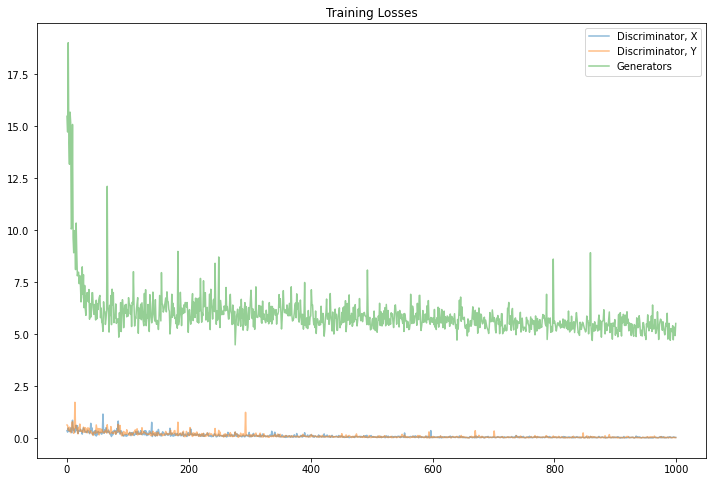

In [34]:
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, X', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, Y', alpha=0.5)
plt.plot(losses.T[2], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()

---
## Evaluate the Result!

As you trained this model, you may have chosen to sample and save the results of your generated images after a certain number of training iterations. This gives you a way to see whether or not your Generators are creating *good* fake images. For example, the image below depicts real images in the $Y$ set, and the corresponding generated images during different points in the training process. You can see that the generator starts out creating very noisy, fake images, but begins to converge to better representations as it trains (though, not perfect).

<img src='notebook_images/sample-004000-summer2winter.png' width=50% />

Below, you've been given a helper function for displaying generated samples based on the passed in training iteration.

In [35]:
import matplotlib.image as mpimg

# helper visualization code
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('X to Y')
    ax2.imshow(y2x)
    ax2.set_title('Y to X')


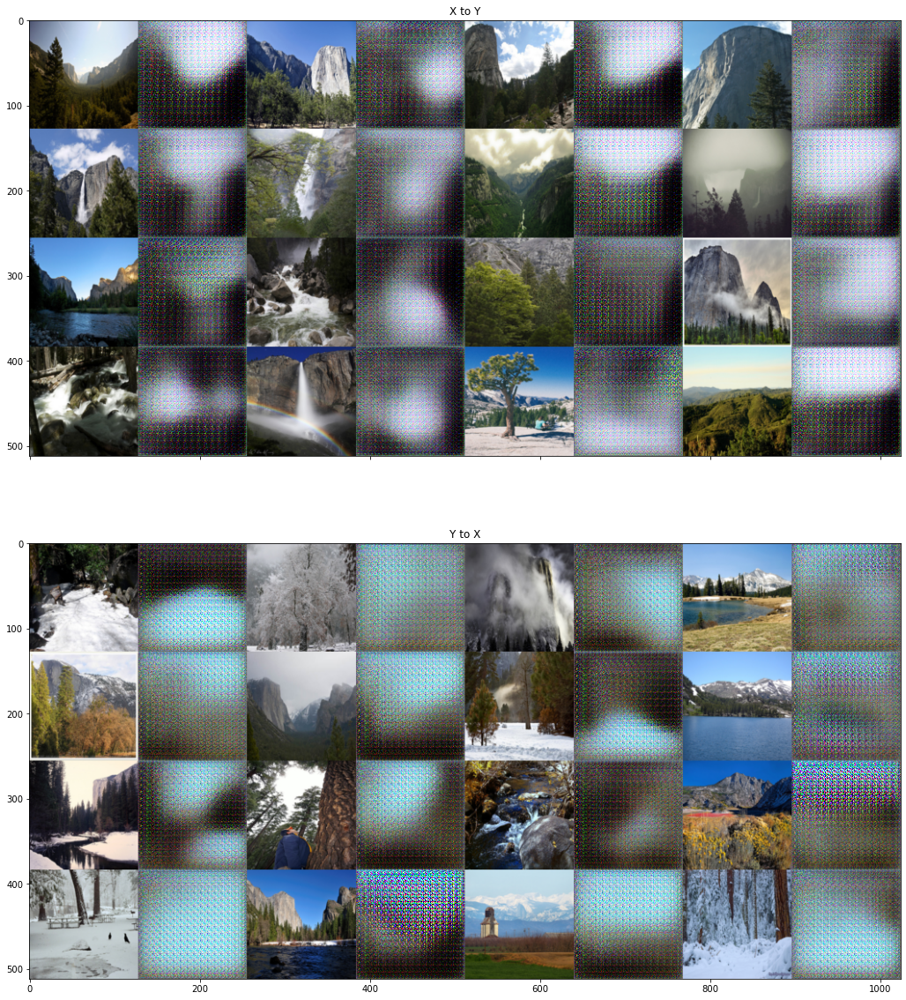

In [36]:
# view samples at iteration 100
view_samples(100, 'samples_cyclegan')

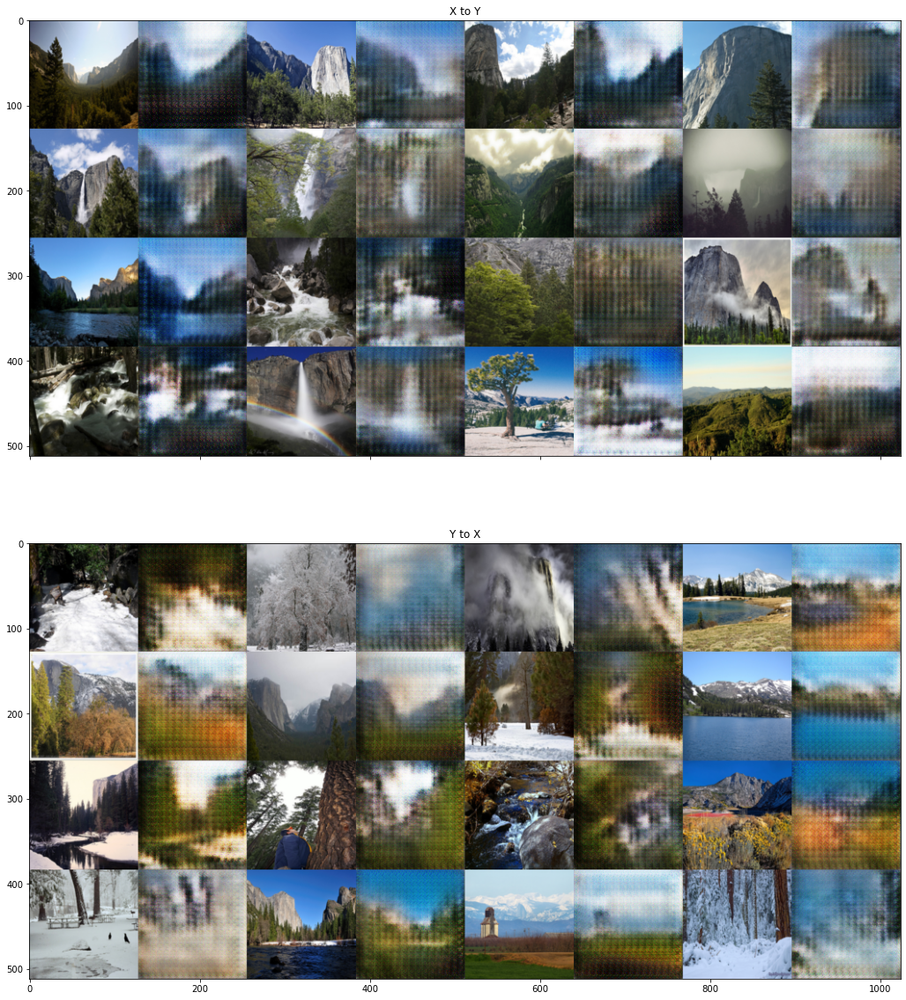

In [37]:
# view samples at iteration 1000
view_samples(1000, 'samples_cyclegan')

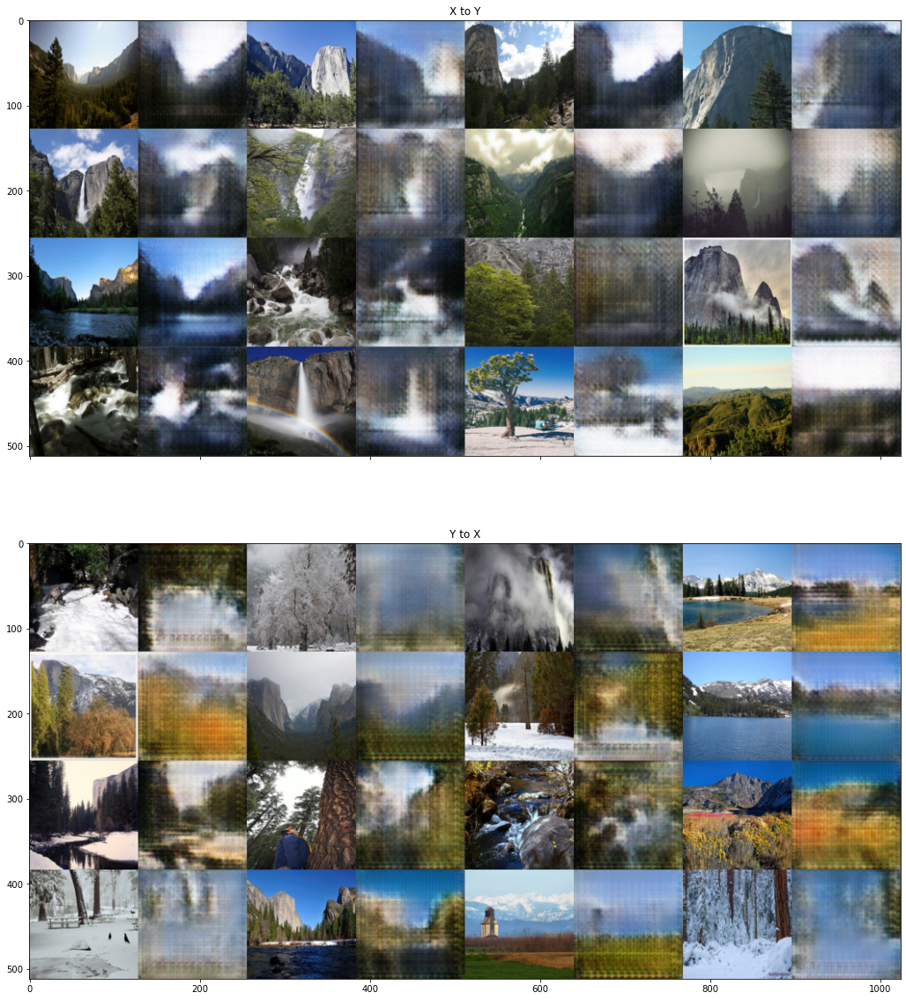

In [38]:
# view samples at iteration 2000
view_samples(2000, 'samples_cyclegan')

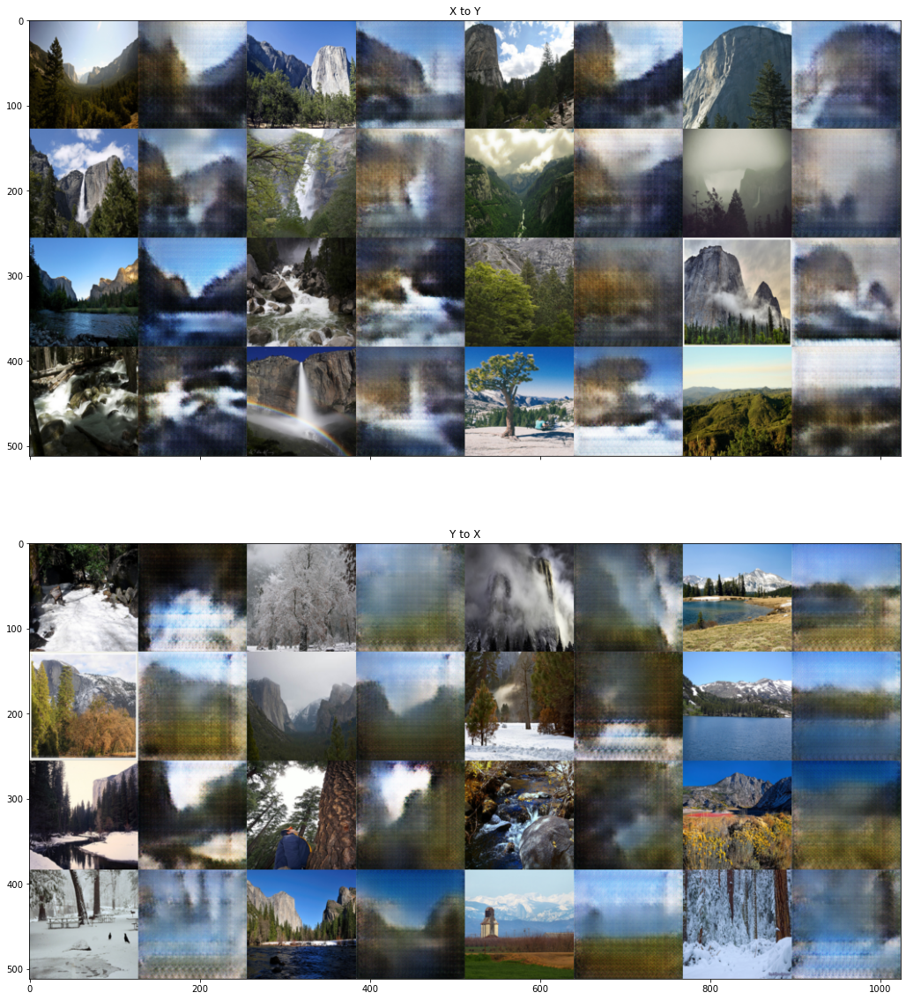

In [39]:
# view samples at iteration 3000
view_samples(3000, 'samples_cyclegan')

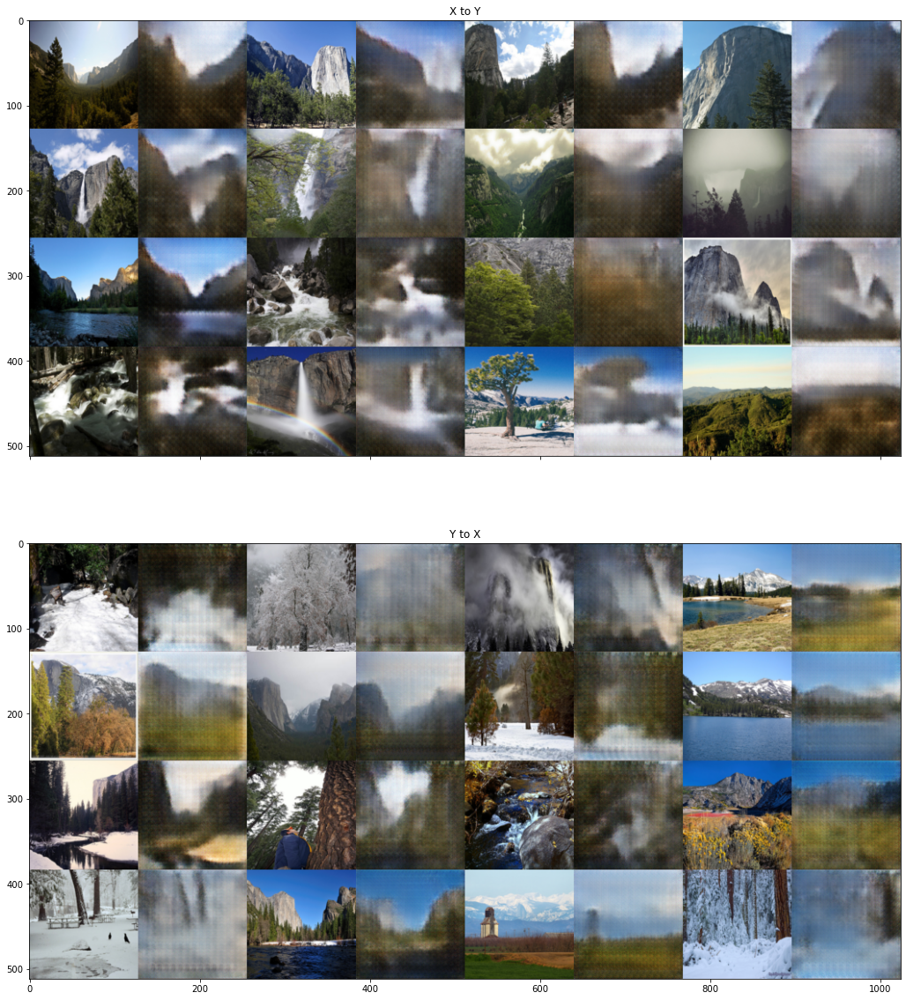

In [41]:
# view samples at iteration 5000
view_samples(5000, 'samples_cyclegan')

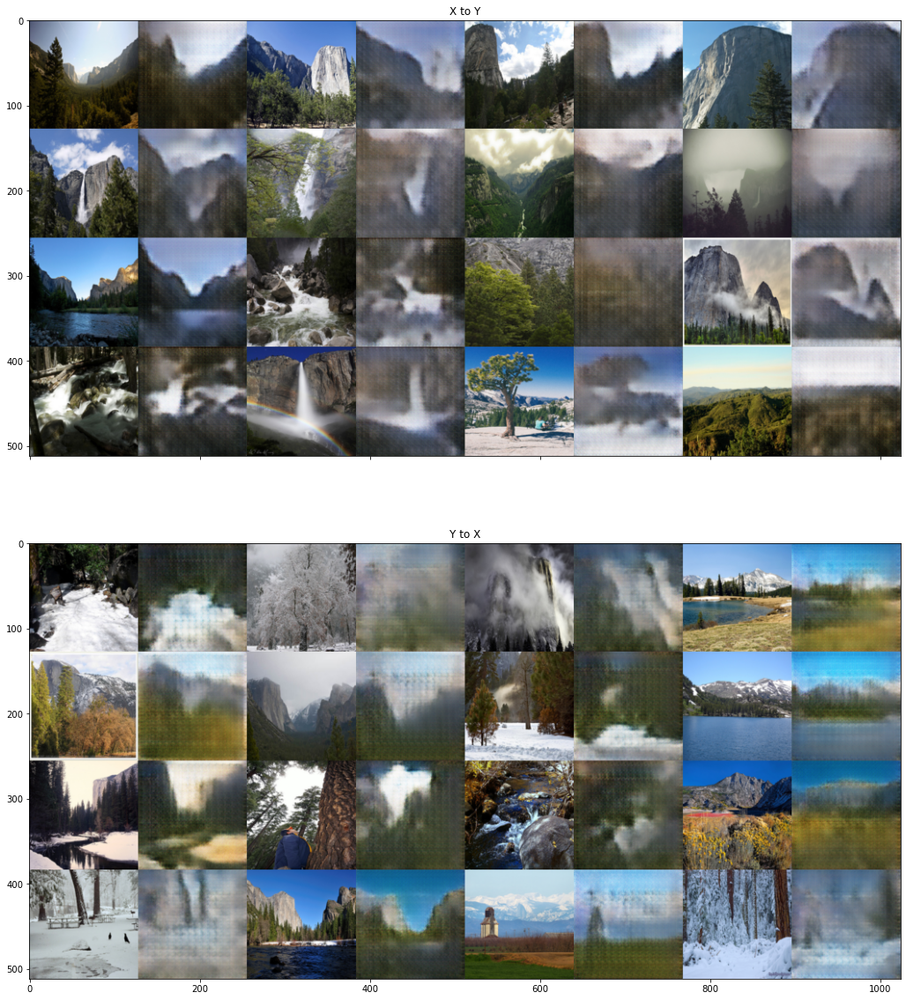

In [42]:
# view samples at iteration 8000
view_samples(8000, 'samples_cyclegan')

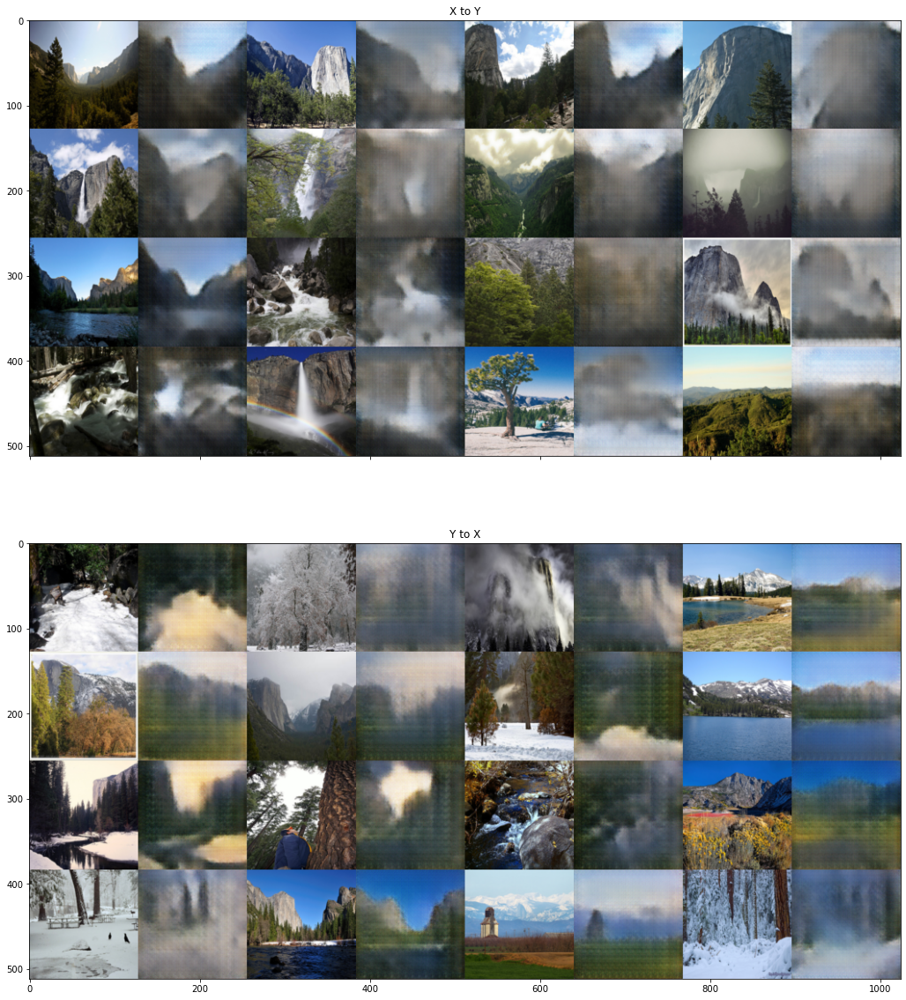

In [43]:
# view samples at iteration 10000
view_samples(10000, 'samples_cyclegan')

---
## Further Challenges and Directions

* One shortcoming of this model is that it produces fairly low-resolution images; this is an ongoing area of research; you can read about a higher-resolution formulation that uses a multi-scale generator model, in [this paper](https://arxiv.org/abs/1711.11585).
* Relatedly, we may want to process these as larger (say 256x256) images at first, to take advantage of high-res data.
* It may help your model to converge faster, if you initialize the weights in your network.
* This model struggles with matching colors exactly. This is because, if $G_{YtoX}$ and $G_{XtoY}$ may change the tint of an image; the cycle consistency loss may not be affected and can still be small. You could choose to introduce a new, color-based loss term that compares $G_{YtoX}(y)$ and $y$, and $G_{XtoY}(x)$ and $x$, but then this becomes a supervised learning approach. 
* This unsupervised approach also struggles with geometric changes, like changing the apparent size of individual object in an image, so it is best suited for stylistic transformations.
* For creating different kinds of models or trying out the Pix2Pix Architecture, [this Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/) which implements CycleGAN *and* Pix2Pix in PyTorch is a great resource.

**Once you are satified with your model, you are ancouraged to test it on a different dataset to see if it can find different types of mappings!**

---

### Different datasets for download

You can download a variety of datasets used in the Pix2Pix and CycleGAN papers, by following instructions in the [associated Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/README.md). You'll just need to make sure that the data directories are named and organized correctly to load in that data.